In [2]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from matplotlib.lines import Line2D
import numpy as np
import re

def plot_reg(label1, label2, df, row=0, col=0, ind=0, save = False):
    """
    Plots a regression scatter plot with rho and p-value displayed.

    Args:
        label1: The first name column of data as a Pandas Series.
        label1: The second name column of data as a Pandas Series.
    """

    # behdata1 = behdata.dropna(subset=['SBSOD','D1_neg_social_cosine_distance_error'])


    df_dropped = df.dropna(subset=[label1,label2])
    df1 = df_dropped[label1]
    df2 = df_dropped[label2]


    if row != 0:
        plt.subplot(row, col, ind)

    rho, p_value = pearsonr(df1, df2)

    # 根据 p 值添加星号
    if p_value <= 0.0001:
        stars = "****"
    elif p_value <= 0.001:
        stars = "***"
    elif p_value <= 0.01:
        stars = "**"
    elif p_value <= 0.05:
        stars = "*"
    else:
        stars = ""

    sns.set_theme(style="whitegrid",font_scale=1.2)

    g = sns.regplot(x=df1, y=df2, 
                    color='blue', 
                    marker='o',
                    scatter_kws={'s': 60,'color':'#4169E1'},
                    line_kws={'color':'green'},#设置线属性，参考 plt.
                    truncate=False,#让拟合线与轴相交
                    )

    plt.text(0.95, 0.95, f'rho: {rho:.2f}\n p-value: {p_value:.4f}{stars}',
             horizontalalignment='right',
             verticalalignment='top',
             transform=plt.gca().transAxes)
    
    if save:
        plt.savefig('corr_fig/'+label1+'_'+label2+'.svg', dpi=900)
    else:
        plt.show()
    plt.clf()  # 清除当前图形，以避免叠加效果


def plot_reg_diff(label1, label2, data1, data2, save = False):
    """
    Plots a regression scatter plot with rho and p-value displayed.
    Variables in Different table

    Args:
        label1: The first name column of data as a Pandas Series.
        label1: The second name column of data as a Pandas Series.
    """
    df1 = data1[label1]
    df2 = data2[label2]

    rho, p_value = pearsonr(df1, df2)
    sns.set_theme(style="whitegrid",font_scale=1.2)

    g = sns.regplot(x=df1, y=df2, 
                    color='g', 
                    marker='o',
                    scatter_kws={'s': 60,'color':'g',},
                    line_kws={'color':'#000000'},#设置线属性，参考 plt.
                    truncate=False,#让拟合线与轴相交
                    )

    plt.text(0.95, 0.95, f'rho: {rho:.2f}\np-value: {p_value:.3f}',
             horizontalalignment='right',
             verticalalignment='top',
             transform=plt.gca().transAxes)

    if save:
        plt.savefig('corr_fig/'+label1+'_'+label2+'.svg', dpi=900)
    else:
        plt.show()
    plt.clf()  # 清除当前图形，以避免叠加效果


from scipy.stats import pearsonr,spearmanr
def convert_pvalue_to_asterisks(pvalue):

    # return pvalue

    if pvalue <= 0.0001:
        return "****"
    elif pvalue <= 0.001:
        return "***"
    elif pvalue <= 0.01:
        return "**"
    elif pvalue <= 0.05:
        return "*"
    return ""

def corr_sig(df=None, dx=0.5, dy=0.75):
# 计算相关性显著性

    for feature1 in df.columns:
        for feature2 in df.columns:
            if df.columns.to_list().index(feature1) > df.columns.to_list().index(feature2):
                if feature1 != feature2:

                    df_filled = df[[feature1, feature2]].fillna(df.mean())

                    corr_value, p_value = pearsonr(df_filled[feature1], df_filled[feature2]) # fill out empty data using avg value
                    
                    asterisks = convert_pvalue_to_asterisks(p_value)
                    plt.text(
                        df.columns.get_loc(feature2) + dx,
                        df.columns.get_loc(feature1) + dy,
                        asterisks,
                        ha="center",
                        va="center",
                        color = 'white',
                        fontsize=14,
                           
                    )
    return corr_value, p_value

def plot_heatmap(df: pd.DataFrame, title:str, location:str=None, x=20, y=12):
    corr = df.corr()
    fig, ax = plt.subplots(figsize=(x, y))
    mask = np.triu(np.ones_like(corr, dtype=bool))
    sns.heatmap(corr, annot=True, mask=mask, fmt=".2g", linewidths=.8, ax=ax, cmap='viridis', 
                annot_kws={"fontsize": 12})
    corr_sig(df)
    plt.title(title+ ' N='+str(len(df)))
    # plt.savefig('Correlation_Matrix_of_Questionnaire_and_Navigation_Ability.svg',dpi=600)
    if location == None:
        plt.show()
    else:
        plt.savefig(location+'.svg', dpi=600)

def significance_label(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# 绘制显著性矩阵热度图

def draw_corr(beh_df, neu_df, dx=.63, dy=.5, location=None):

    merged_df = pd.merge(beh_df, neu_df, on='sub_ID')
    # .dropna()
    plot_heatmap(merged_df, 'Heatmap 1 ', location=location)
    corr_matrix = merged_df.corr()


    beh_columns = beh_df.columns.to_list().copy()
    neu_columns = neu_df.columns.to_list().copy()
    beh_columns.remove('sub_ID')
    neu_columns.remove('sub_ID')


    sub_corr_matrix = corr_matrix.loc[beh_columns, neu_columns]
    # 使用seaborn绘制热度图
    # plt.figure(figsize=(8, 10))

    # sns.heatmap(sub_corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    # corr_sig(sub_corr_matrix, dx,dy)
    # plt.title('Correlation Heatmap')
    # plt.show()

    # sns.heatmap(sub_corr_matrix.astype(float), annot=sub_corr_matrix.applymap(significance_label), fmt="", linewidths=.8, cmap='coolwarm', cbar=False)
    # plt.title('P-Value Significance Matrix')

    return merged_df

def generate_corrmap(df1, df2, list1, list2, dx= .63, dy=.5, location = None):
    
    df_cut = df1.loc[:,list1]
    df_cut2 = df2.loc[:,list2]
    return draw_corr(df_cut, df_cut2, dx,dy, location=location)


In [16]:
asydata = pd.read_excel('brain_asymmetry_new.xlsx')

asydata_old = pd.read_excel('brain_asymmetry.xlsx')

# asydata = pd.read_excel('brain_asymmetry_0.xlsx')

asydata['sub_ID'] += 300
asydata_cropped = asydata.loc[:,['LFC_AA_index_log', 'LTPJ_AA_index_log']]
asydata_cropped['sub_ID'] = asydata['sub_ID'] 
# asydata_cropped = asydata.loc[:,['FC_AA_index_log', 'TPJ_AA_index_log']]


asydata_old['sub_id'] += 300
asydata_cropped_old = asydata_old.loc[:,['LFC_AA_index_log', 'LTPJ_AA_index_log']]
asydata_cropped_old['sub_ID'] = asydata_old['sub_id'] 


# asydata_cropped.tail()
asydata_old.tail()

,sub_id,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,...,TP10,FCz,LFC_index,RFC_index,LTPJ_index,RTPJ_index,LFC_AA_index,LFC_AA_index_log,LTPJ_AA_index,LTPJ_AA_index_log
53,356,7.984487e-11,1.178389e-10,1.639420e-11,1.731295e-11,9.278887e-12,9.282649e-12,1.204821e-11,1.311655e-11,2.007375e-11,...,1.912512e-11,1.245211e-11,1.696166e-11,1.472964e-11,1.363447e-11,1.563567e-11,0.070430,0.612762,-0.068370,-0.594781
54,357,4.638470e-11,4.448479e-11,2.958116e-11,2.626815e-11,2.263133e-11,2.238721e-11,6.990421e-11,9.418369e-11,4.474997e-11,...,5.950534e-11,2.871245e-11,2.678696e-11,2.599440e-11,4.556164e-11,6.943706e-11,0.015016,0.130436,-0.207615,-1.829920
55,358,6.772241e-11,8.586233e-11,1.708720e-11,1.401533e-11,6.766715e-12,5.613014e-12,1.360831e-11,1.426335e-11,5.420011e-11,...,4.844719e-11,1.014634e-11,1.825990e-11,1.403569e-11,1.916153e-11,2.072595e-11,0.130798,1.142646,-0.039221,-0.340841
56,359,1.456037e-11,1.599031e-11,7.873772e-12,8.982075e-12,9.802880e-12,6.744969e-12,1.486061e-11,2.184425e-11,2.599889e-11,...,1.665236e-11,9.239387e-12,8.070186e-12,8.665657e-12,1.393086e-11,1.893730e-11,-0.035581,-0.309180,-0.152319,-1.333401
57,360,2.425351e-11,2.531974e-11,1.005559e-11,9.432040e-12,6.503511e-12,6.590175e-12,9.755552e-12,9.901369e-12,8.443581e-12,...,8.592104e-12,9.798722e-12,1.546351e-11,9.535809e-12,1.014519e-11,8.327535e-12,0.237115,2.099506,0.098397,0.857439


In [4]:
behdata = pd.read_excel('combined_data_with_columns.xlsx')
behdata.tail()

,sub_ID,space_cosine_distance_error,social_cosine_distance_error,landmark_cosine_distance_error,space_euclidean_distance_error,social_euclidean_distance_error,landmark_euclidean_distance_error,space_manhattan_distance_error,social_manhattan_distance_error,landmark_manhattan_distance_error,...,SAQ,SBSOD,SPS,Other,Gender,practice_correct,practice_time,practice_correct_last,practice_time_last,practice_times
55,356,0.754900,1.278754,0.229823,0.303946,0.586532,0.190558,0.398834,0.789796,0.201786,...,39,68,28,32,1,0.645833,6.996624,0.8750,5.442162,3
56,357,0.982148,0.807159,0.303702,0.507308,0.387905,0.194179,0.624362,0.500255,0.240625,...,33,60,32,24,1,0.562500,11.995218,0.6875,9.709953,3
57,358,0.701234,0.294541,0.374755,0.267768,0.222956,0.256178,0.345536,0.270408,0.317156,...,24,46,28,25,1,0.562500,9.991786,0.8750,6.228225,3
58,359,0.799761,0.686637,0.202278,0.351061,0.388558,0.143219,0.450836,0.512916,0.156047,...,32,60,38,25,1,0.718750,17.421020,0.8750,11.941098,2
59,360,1.151437,0.672885,0.198223,0.497121,0.377090,0.147927,0.612117,0.489923,0.166645,...,23,59,37,28,1,0.687500,22.927313,0.8750,8.130622,2


## behavior Correlation

1. Questionnaire and Practice

In [17]:
behaviorlist = behdata.columns.to_list()

# Questionnarie
quizlist = ['sub_ID','SAS','SIAS','LSAS','SAQ','SBSOD','SPS']
# Practice
nav_prac = ['sub_ID']+[i for i in behaviorlist if 'practice' in i ]

# Nav
nav = ['sub_ID']+ [ i for i in behaviorlist if 'nav' in i and 'reward' not in i]
# Nav Reward
nav_reward = ['sub_ID']+ [ i for i in behaviorlist if 'reward' in i]

#Nav Leave/Approach 
nav_approach = ['sub_ID']+ [ i for i in behaviorlist if 'Approach' in i and 'block' not in i]

nav_app_speed = ['sub_ID']+ [ i for i in behaviorlist if 'Approach' in i and 'Speed' in i ]



nav_leave = ['sub_ID']+ [ i for i in behaviorlist if 'Leave' in i and 'block' not in i]

nav_leave_speed = ['sub_ID']+ [ i for i in behaviorlist if 'Leave' in i and 'Speed' in i]

# Nav Entropy
nav_entropy = ['sub_ID'] + [ i for i in behaviorlist if 'Entropy' in i and '_mem_' not in i]

nav_entropy_mem_change = ['sub_ID'] + [ i for i in behaviorlist if '_mem_' in i and 'Entropy' in i]

# Nav anxiety
# nav_rate including anxiety and willingness self-rating value/time
nav_rate = ['sub_ID']+ [ i for i in behaviorlist if 'anxiety' in i or 'will' in i]

nav_no_block = [i for i in nav if 'block' not in i]
nav_no_block

# Nav_MemTest recognition and self-confidence rating
pattern = r'(^Whole|\d$)'
nav_mem = ['sub_ID']+ [ i for i in behaviorlist if re.search(pattern, i) ]

nav_conf = ['sub_ID']+ [ i for i in behaviorlist if 'Confidence' in i ]

nav_mem_whole = ['sub_ID']+ [ i for i in behaviorlist if i.startswith('Whole') ]


# distance_error
nav_arr = ['sub_ID']+ [ i for i in behaviorlist if 'distance_error' in i ]

nav_arrd1 = ['sub_ID']+ [ i for i in behaviorlist if 'distance_error' in i and 'D2' not in i and 'manhattan' not in i ]

nav_arrd2 = ['sub_ID']+ [ i for i in behaviorlist if 'distance_error' in i and 'D2' in i and 'manhattan' not in i]

# Nav D2 pref
pattern = r'^(?!Whole).*RT$'
nav_pref = ['sub_ID']+ [ i for i in behaviorlist if 'preference' in i]+ [i for i in behaviorlist if re.search(pattern, i)]
nav_pref = list(set(nav_pref)) # drop duplicates

# Nav D2 Emotion Task
nav_emo = ['sub_ID']+ [ i for i in behaviorlist if '_emo_' in i ]
nav_emo_v = ['sub_ID']+ [ i for i in behaviorlist if '_emo_' in i and 'valence' in i ]
nav_emo_a = ['sub_ID']+ [ i for i in behaviorlist if '_emo_' in i and 'arousal' in i ]

nav_leave_speed


['sub_ID',
 'Social_Leave_Speed',
 'Social_block2_Leave_Speed',
 'Social_block4_Leave_Speed',
 'Social_block6_Leave_Speed',
 'pos_Social_Leave_Speed',
 'neg_Social_Leave_Speed',
 'Space_Leave_Speed',
 'Space_block1_Leave_Speed',
 'Space_block3_Leave_Speed',
 'Space_block5_Leave_Speed',
 'pos_Space_Leave_Speed',
 'neg_Space_Leave_Speed']

1. questionnaire and practice


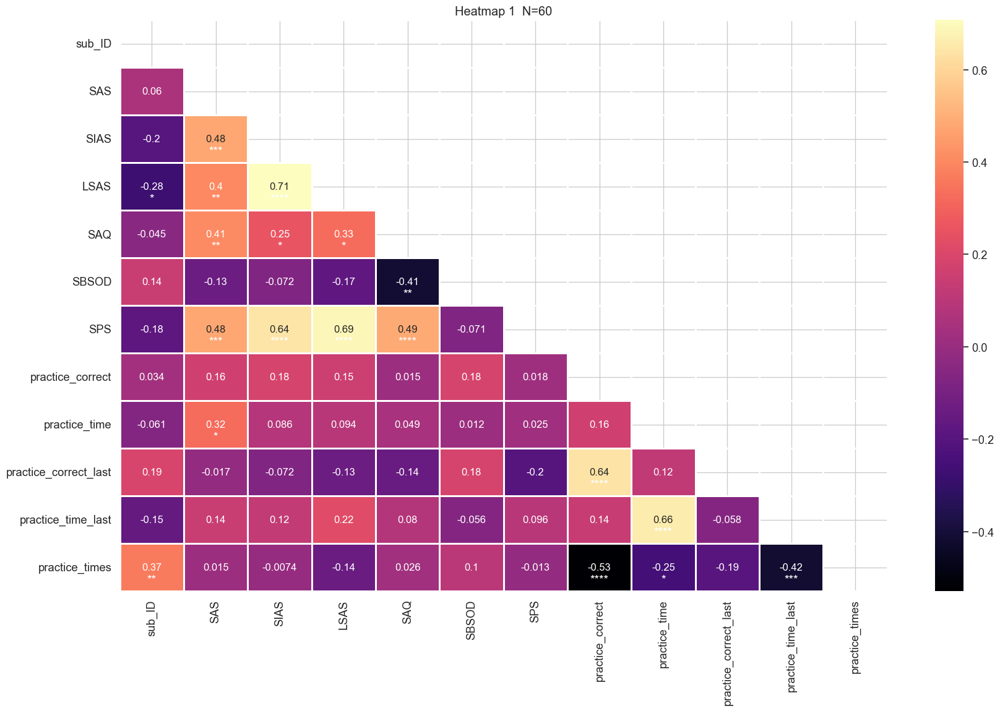

In [88]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_prac, location = 'plot_behave/ques_prac.svg')

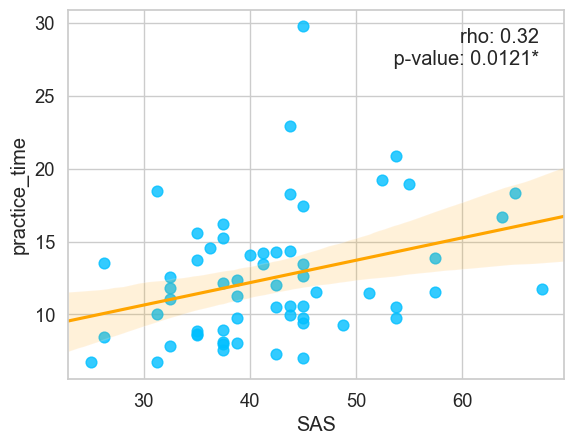

<Figure size 640x480 with 0 Axes>

In [90]:
# 发现 SAS 和 练习的时间 正相关
plot_reg('SAS','practice_time',behdata,row=0,col=0,ind=0,save =False)

2. questionnaire and nav (speed / distance / pausetime)

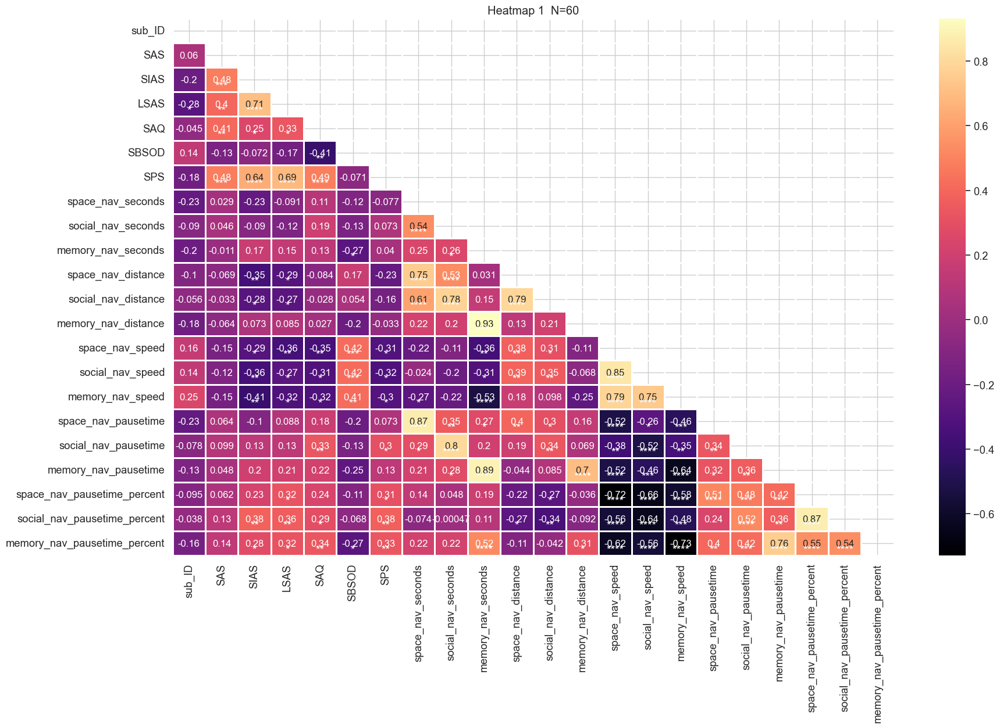

In [91]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_no_block, location='plot_behave/ques_nav')

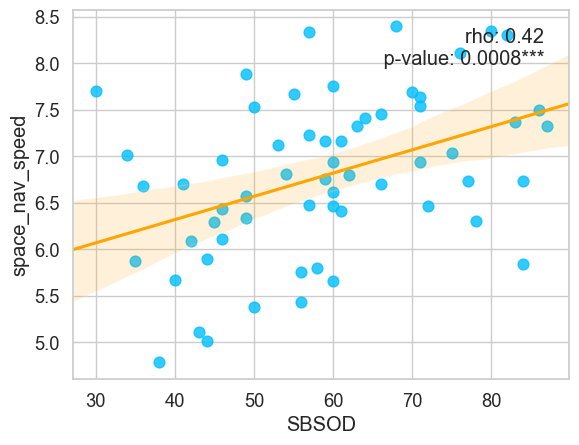

<Figure size 640x480 with 0 Axes>

In [95]:
# 发现 SBSOD 和 space_nav_speed 正相关
plot_reg('SBSOD','space_nav_speed',behdata,row=0,col=0,ind=0,save =False)

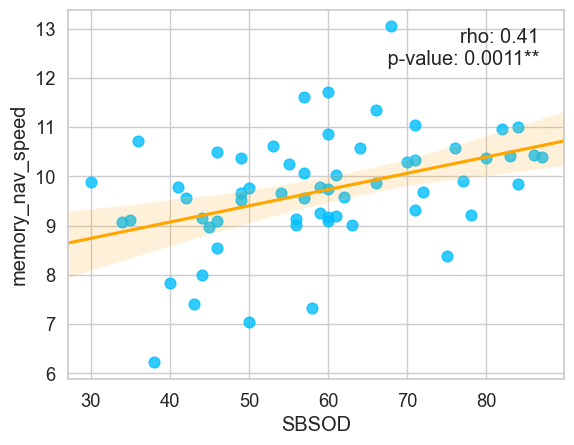

<Figure size 640x480 with 0 Axes>

In [98]:
plot_reg('SBSOD','memory_nav_speed',behdata,row=0,col=0,ind=0,save =False)

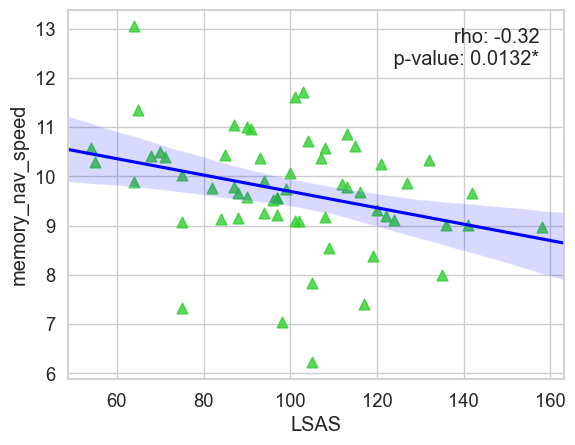

<Figure size 640x480 with 0 Axes>

In [121]:
plot_reg('LSAS','memory_nav_speed',behdata,row=0,col=0,ind=0,save =False)

2.2. questionnaire and nav (leave/approach speed and distance)

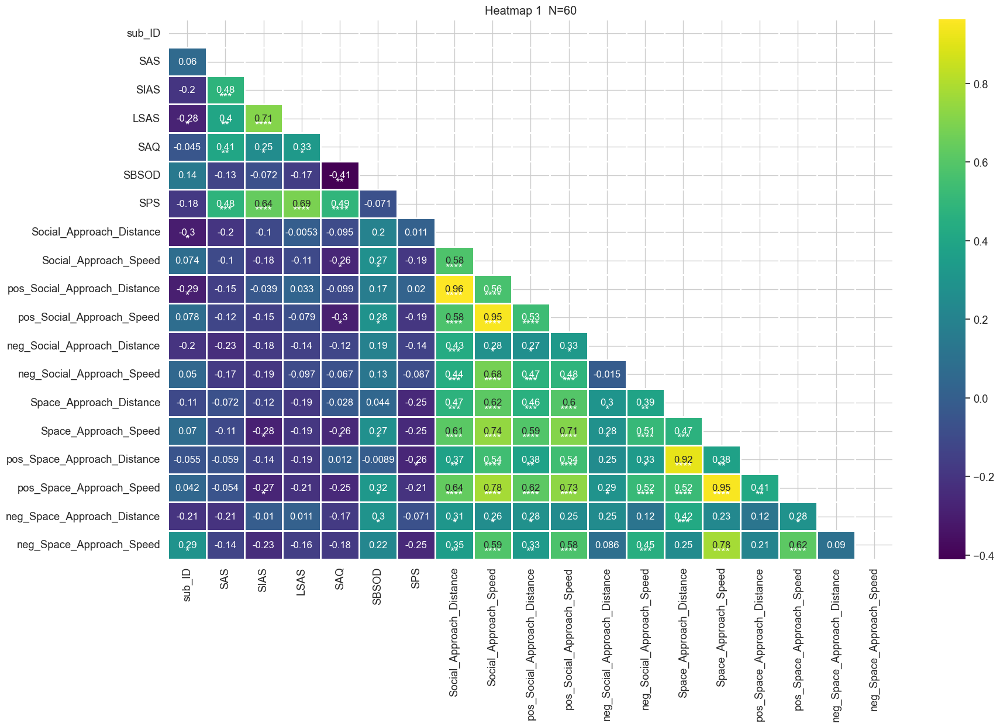

In [37]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_approach, location='plot_behave/ques_nav_approach')

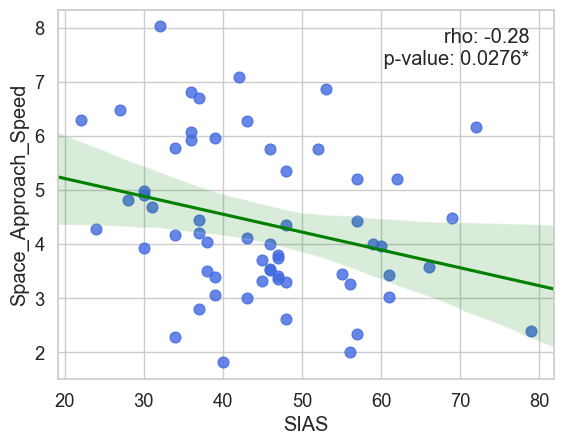

<Figure size 640x480 with 0 Axes>

In [40]:
plot_reg('SIAS','Space_Approach_Speed',behdata,row=0,col=0,ind=0,save =False)

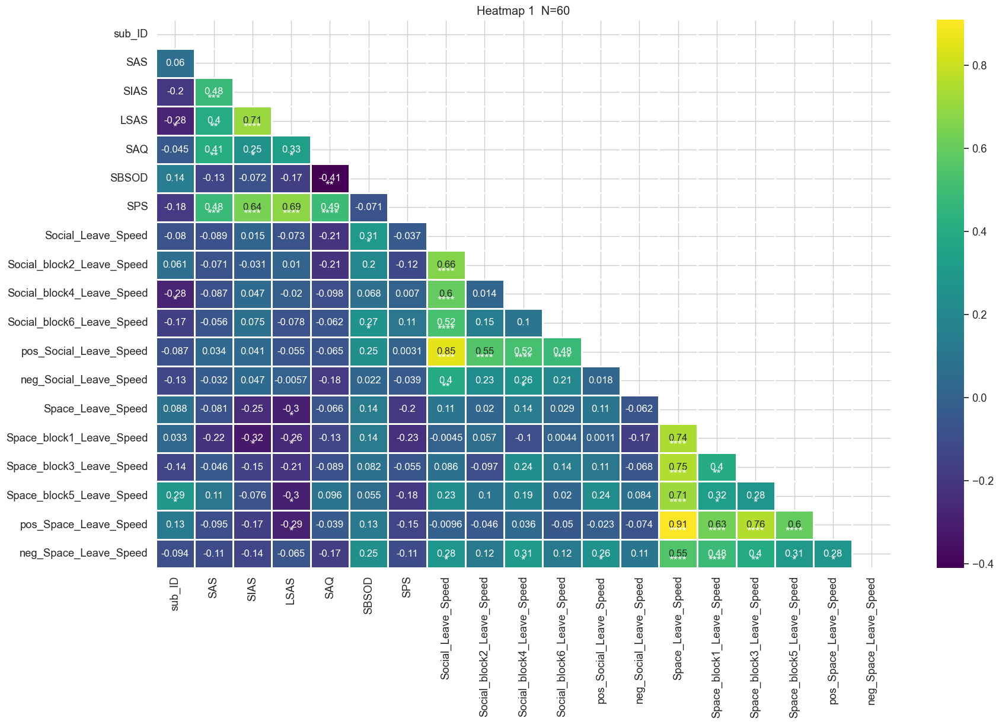

In [29]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_leave_speed, location='plot_behave/ques_nav_leave')

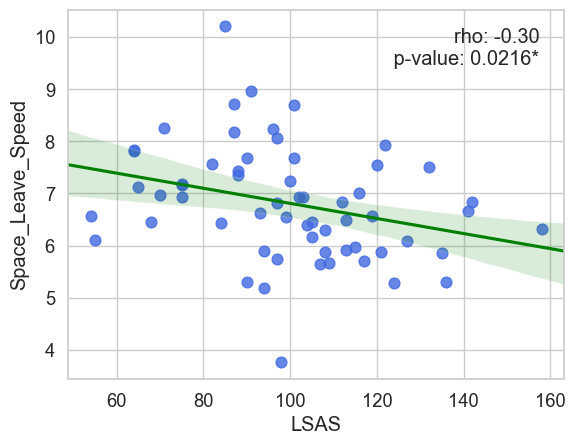

<Figure size 640x480 with 0 Axes>

In [32]:
plot_reg('LSAS','Space_Leave_Speed',behdata,row=0,col=0,ind=0,save =False)

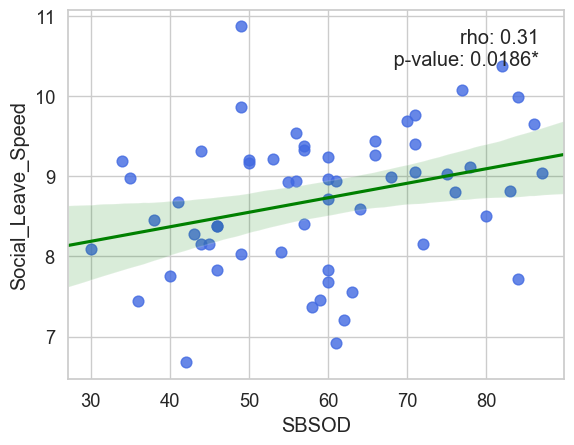

<Figure size 640x480 with 0 Axes>

In [36]:
plot_reg('SBSOD','Social_Leave_Speed',behdata,row=0,col=0,ind=0,save =False)

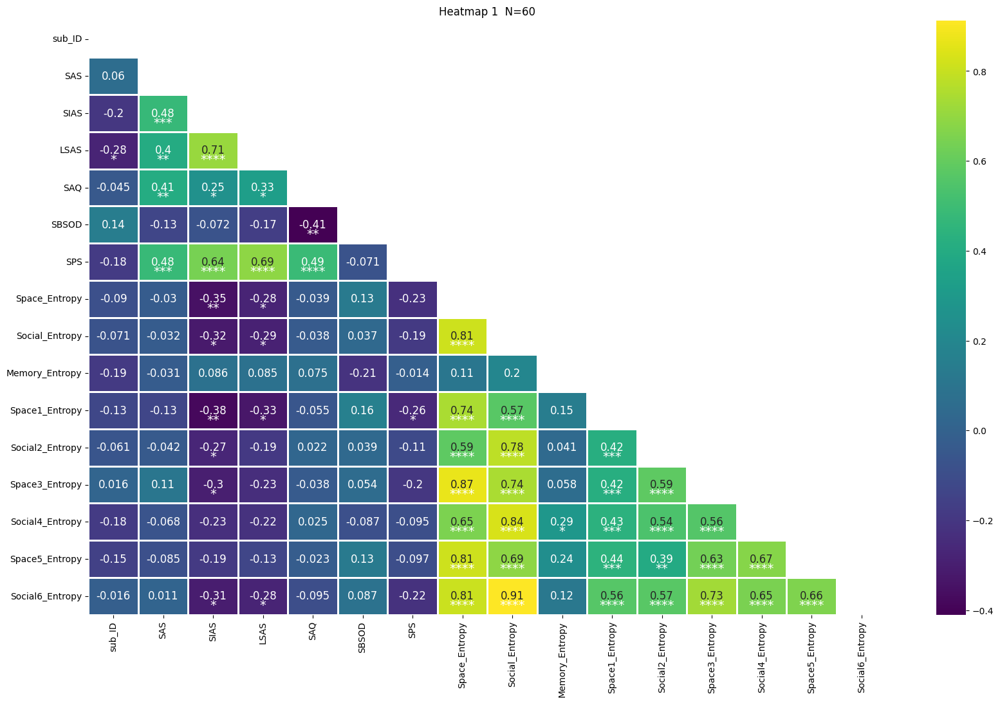

In [14]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_entropy, location='plot_behave/ques_nav_entropy')

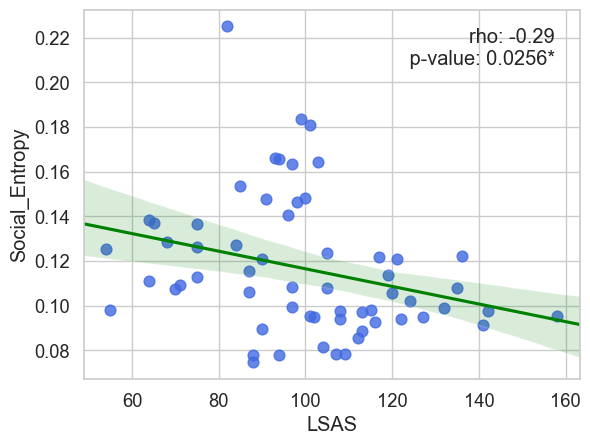

<Figure size 640x480 with 0 Axes>

In [26]:
plot_reg('LSAS','Social_Entropy',behdata,row=0,col=0,ind=0,save =False)

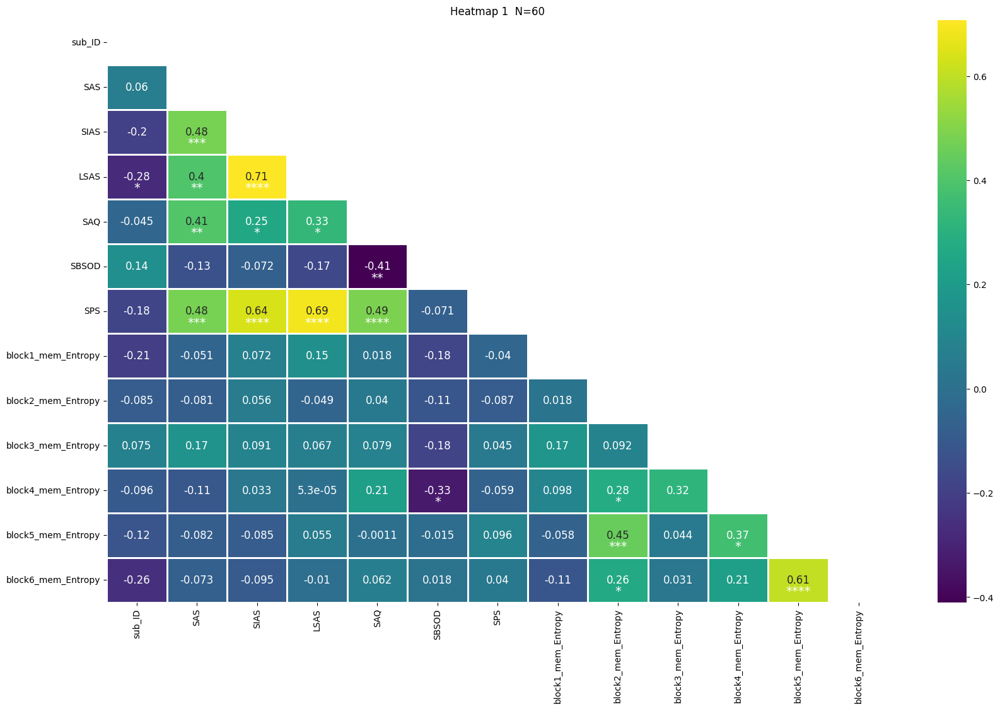

In [11]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_entropy_mem_change, location='plot_behave/ques_nav_entropy_mem_change')

3. questionnaire and nav (reward)

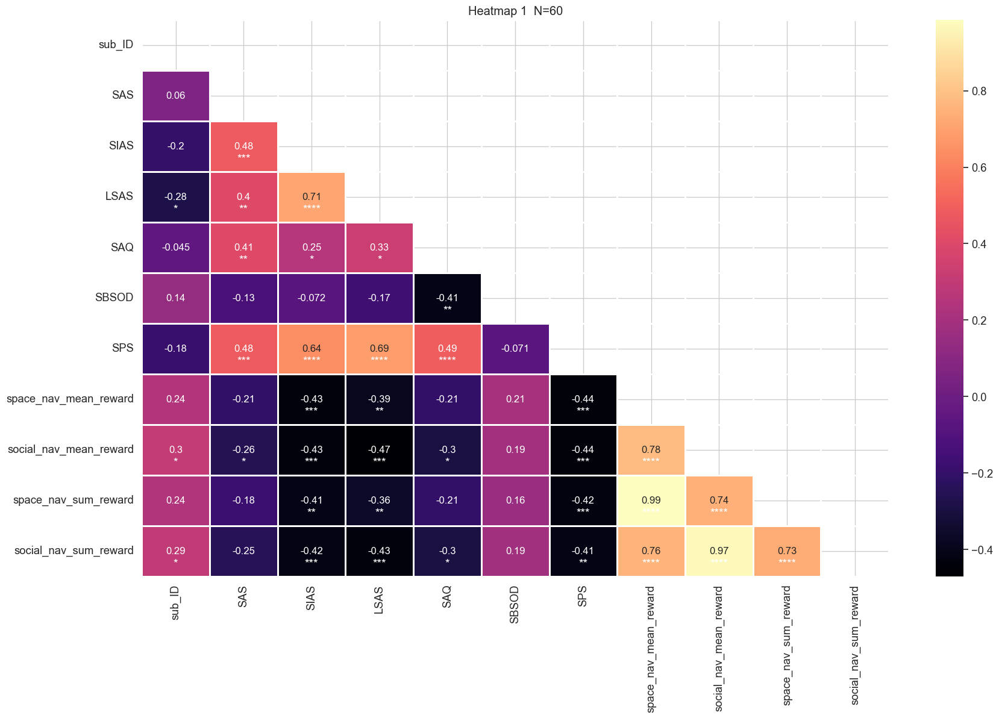

In [122]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_reward, location='plot_behave/ques_nav_reward')

4. questionnaire and nav_rate (willingness/anxiety)

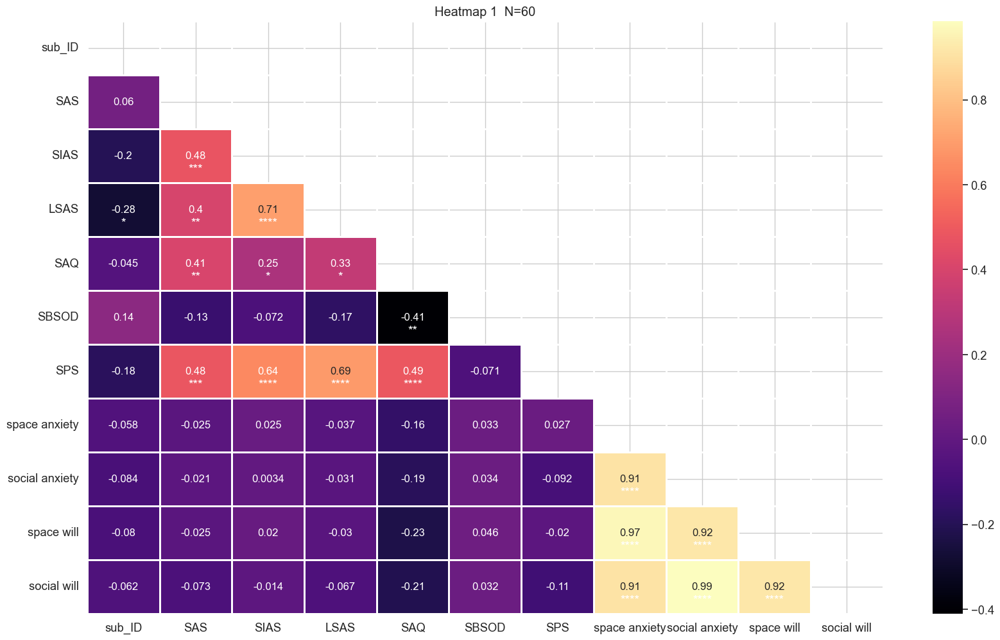

In [123]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_rate, location='plot_behave/ques_nav_rate')

5. questionnaire and nav_mem_conf (confidence rating for recognition task)

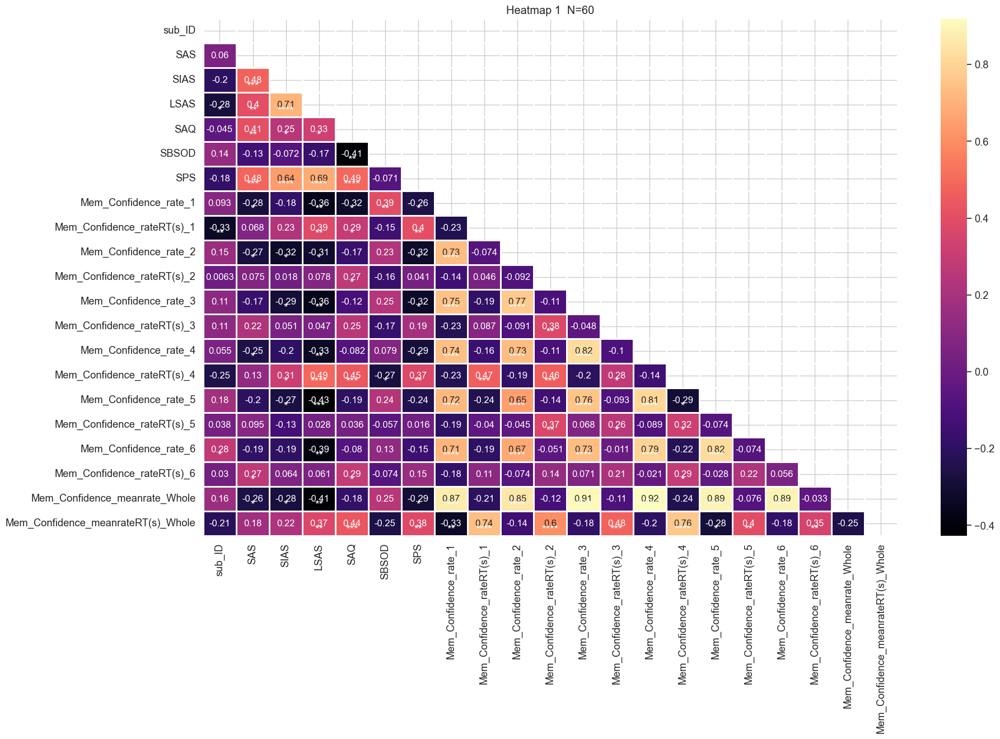

In [137]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_conf, location='plot_behave/ques_nav_memconf')

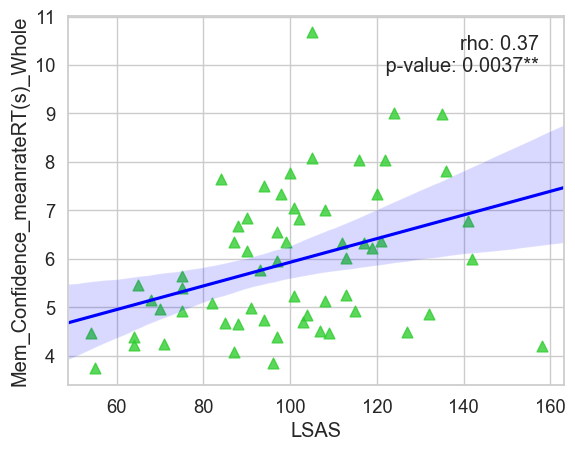

<Figure size 640x480 with 0 Axes>

In [135]:
# plot_reg('SIAS','Mem_Confidence_meanrate_Whole',behdata,row=0,col=0,ind=0,save =False)
plot_reg('LSAS','Mem_Confidence_meanrateRT(s)_Whole',behdata,row=0,col=0,ind=0,save =False)

6. questionnaire and nav_mem ( corr/rts for recognition task)

In [13]:
nav_mem_whole

nav_mem_whole_corr = ['sub_ID'] + [i for i in nav_mem_whole if 'Corr' in i and 'CorrT' not in i and 'CorrF' not in i]

nav_mem_whole_RT = ['sub_ID'] + [i for i in nav_mem_whole if 'RT' in i and 'RTT' not in i and 'RTF' not in i]

nav_mem_whole_corr

['sub_ID',
 'Whole_Corr',
 'Whole_Building_Corr',
 'Whole_Scene_Things_Corr',
 'Whole_Case_Corr',
 'Whole_Male_Corr',
 'Whole_Female_Corr',
 'Whole_Character_Corr']

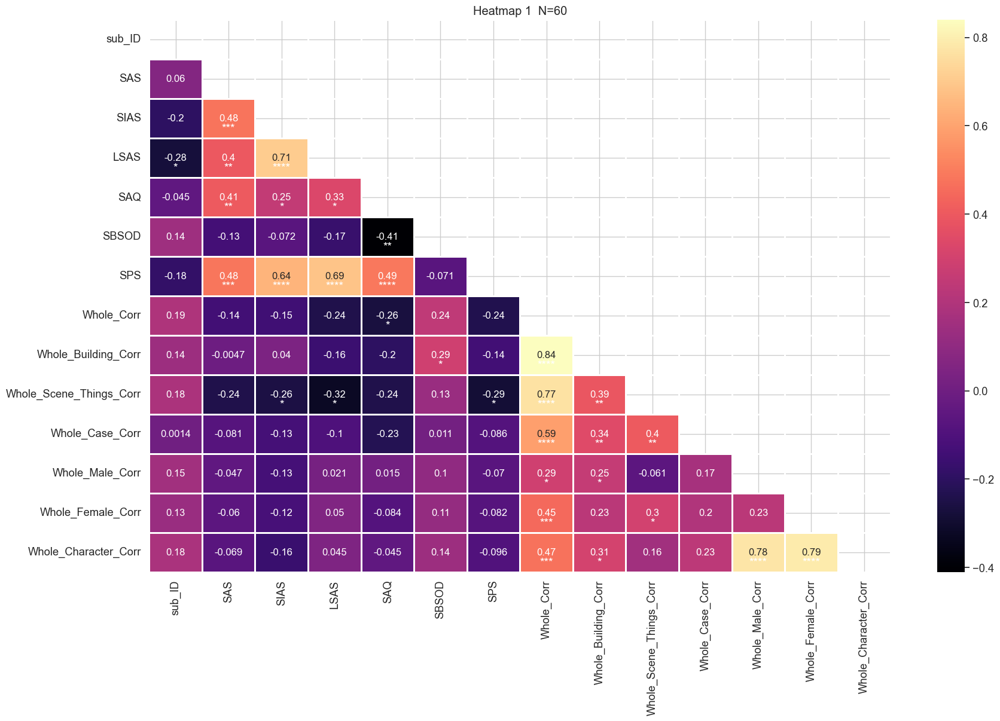

In [143]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_mem_whole_corr, location='plot_behave/ques_nav_mem_corr')

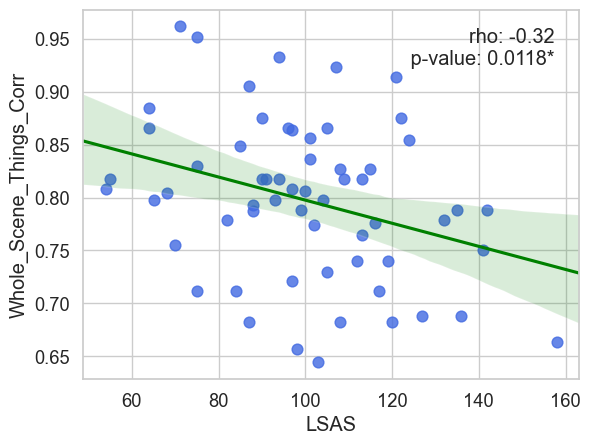

<Figure size 640x480 with 0 Axes>

In [148]:
plot_reg('LSAS','Whole_Scene_Things_Corr',behdata,row=0,col=0,ind=0,save =False)

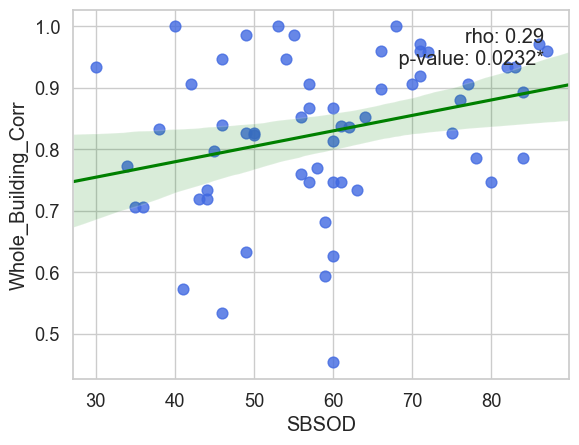

<Figure size 640x480 with 0 Axes>

In [ ]:
plot_reg('SBSOD','Whole_Building_Corr',behdata,row=0,col=0,ind=0,save =False)

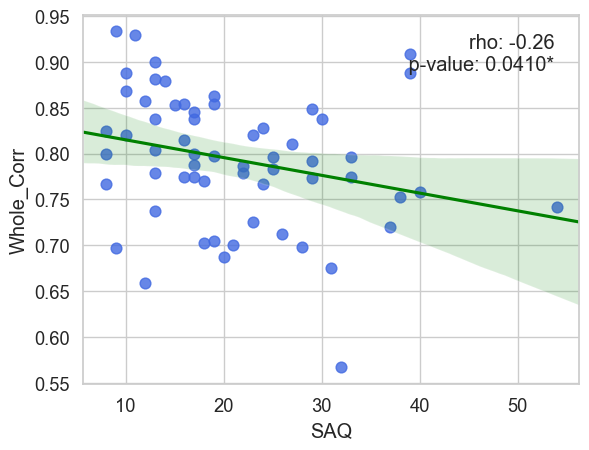

<Figure size 640x480 with 0 Axes>

In [152]:
plot_reg('SAQ','Whole_Corr',behdata,row=0,col=0,ind=0,save =False)

7. questionnaire and nav_arrangement_day1 (distance error)

In [159]:
nav_arrd1

['sub_ID',
 'space_cosine_distance_error',
 'social_cosine_distance_error',
 'landmark_cosine_distance_error',
 'space_euclidean_distance_error',
 'social_euclidean_distance_error',
 'landmark_euclidean_distance_error',
 'pos_space_cosine_distance_error',
 'pos_social_cosine_distance_error',
 'pos_space_euclidean_distance_error',
 'pos_social_euclidean_distance_error',
 'neg_space_cosine_distance_error',
 'neg_social_cosine_distance_error',
 'neg_space_euclidean_distance_error',
 'neg_social_euclidean_distance_error']

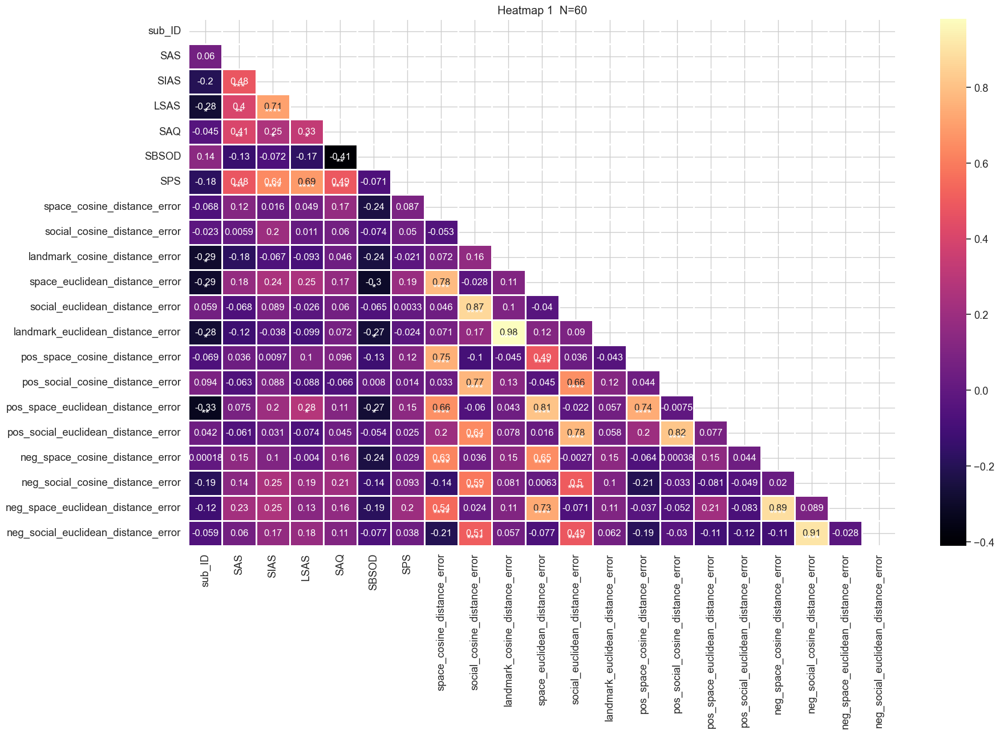

In [160]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_arrd1, location='plot_behave/ques_nav_arranged1')

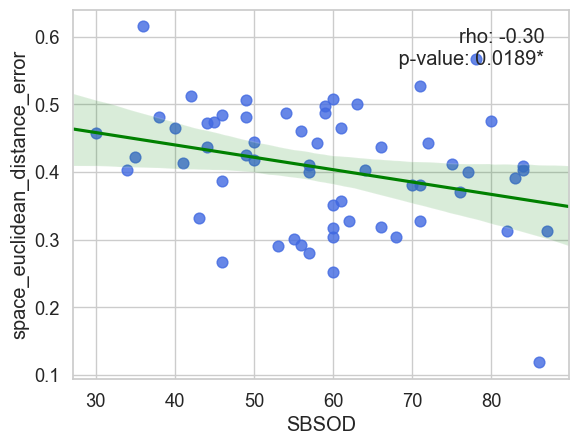

<Figure size 640x480 with 0 Axes>

In [163]:
plot_reg('SBSOD','space_euclidean_distance_error',behdata,row=0,col=0,ind=0,save =False)

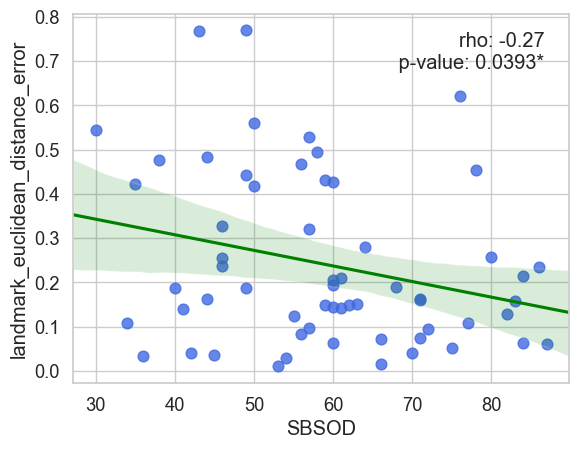

<Figure size 640x480 with 0 Axes>

In [164]:
plot_reg('SBSOD','landmark_euclidean_distance_error',behdata,row=0,col=0,ind=0,save =False)

8. questionnaire and nav_arrangement_day2 (distance error)

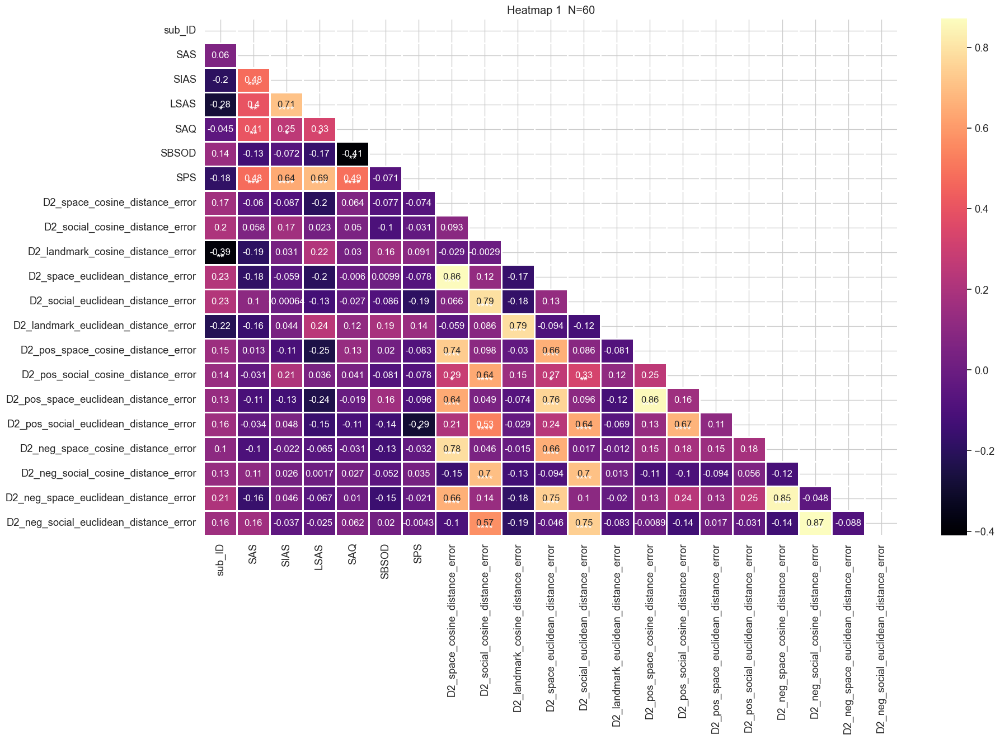

In [165]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_arrd2, location='plot_behave/ques_nav_arranged2')

9. questionnaire and nav_pref_day2 (rt/rate)

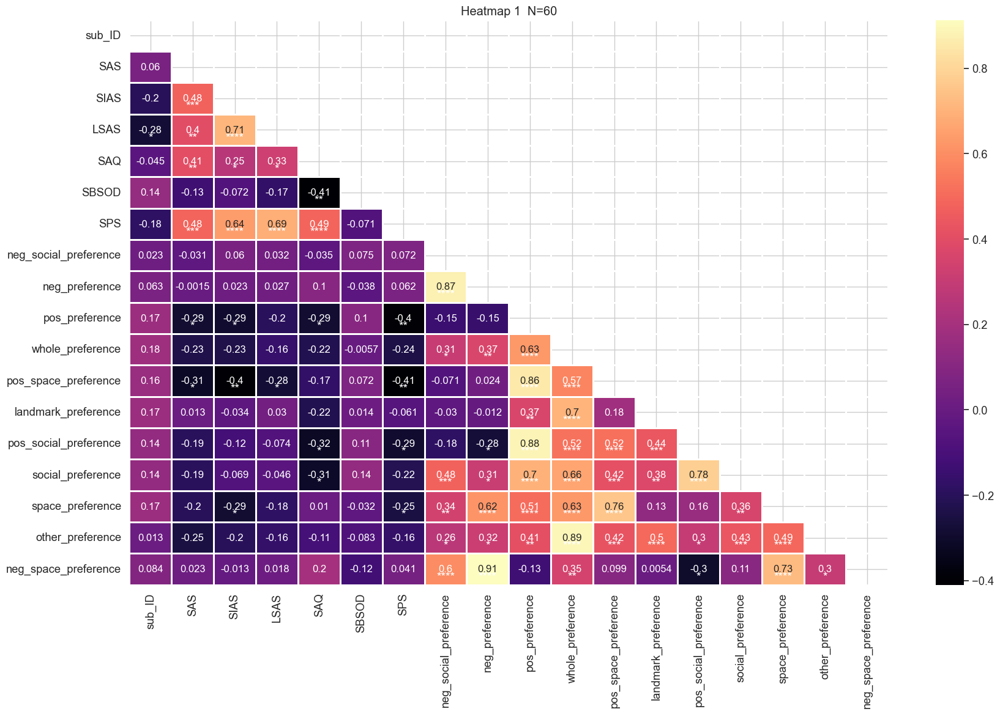

In [175]:
nav_pref_noRT = [i for i in nav_pref if not i.endswith('RT') ]
nav_pref_noRT
c = generate_corrmap(behdata, behdata,quizlist ,nav_pref_noRT, location='plot_behave/ques_nav_preference')

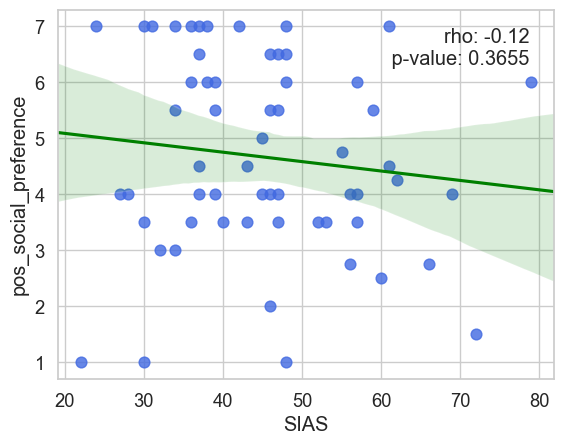

<Figure size 640x480 with 0 Axes>

In [181]:
plot_reg('SIAS','pos_social_preference',behdata,row=0,col=0,ind=0,save =False)

10. questionnaire and nav_emo_day2 (valence / arousal)

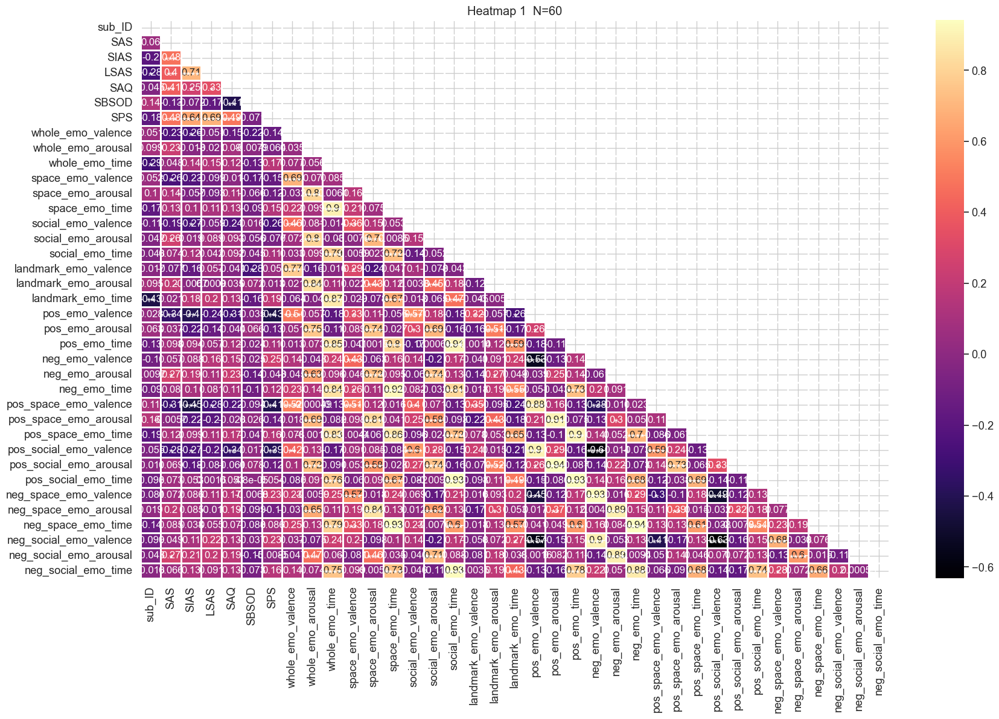

In [182]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_emo, location='plot_behave/ques_nav_emo')

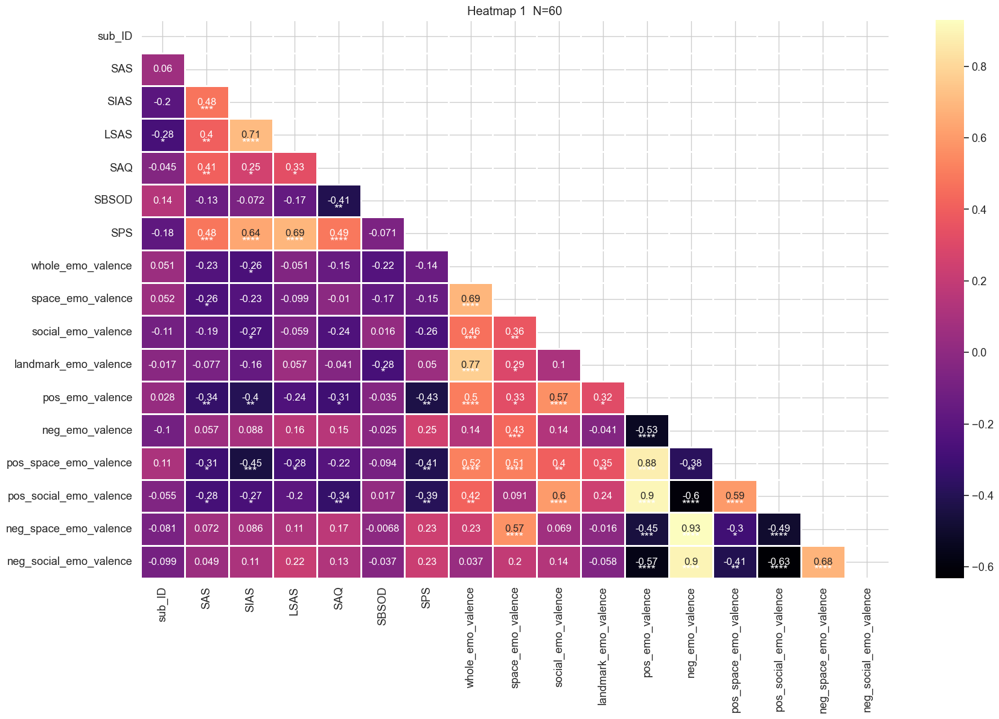

In [183]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_emo_v, location='plot_behave/ques_nav_emo_valence')

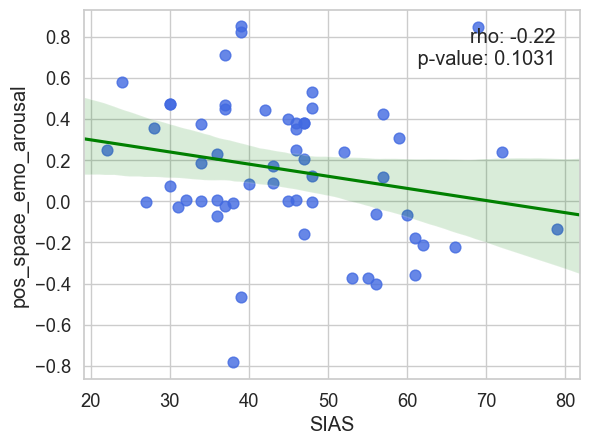

<Figure size 640x480 with 0 Axes>

In [ ]:
plot_reg('SIAS','pos_space_emo_valence',behdata,row=0,col=0,ind=0,save =False)

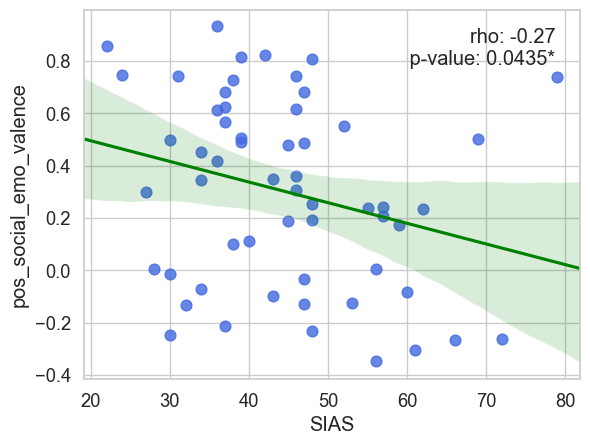

<Figure size 640x480 with 0 Axes>

In [191]:
plot_reg('SIAS','pos_social_emo_valence',behdata,row=0,col=0,ind=0,save =False)

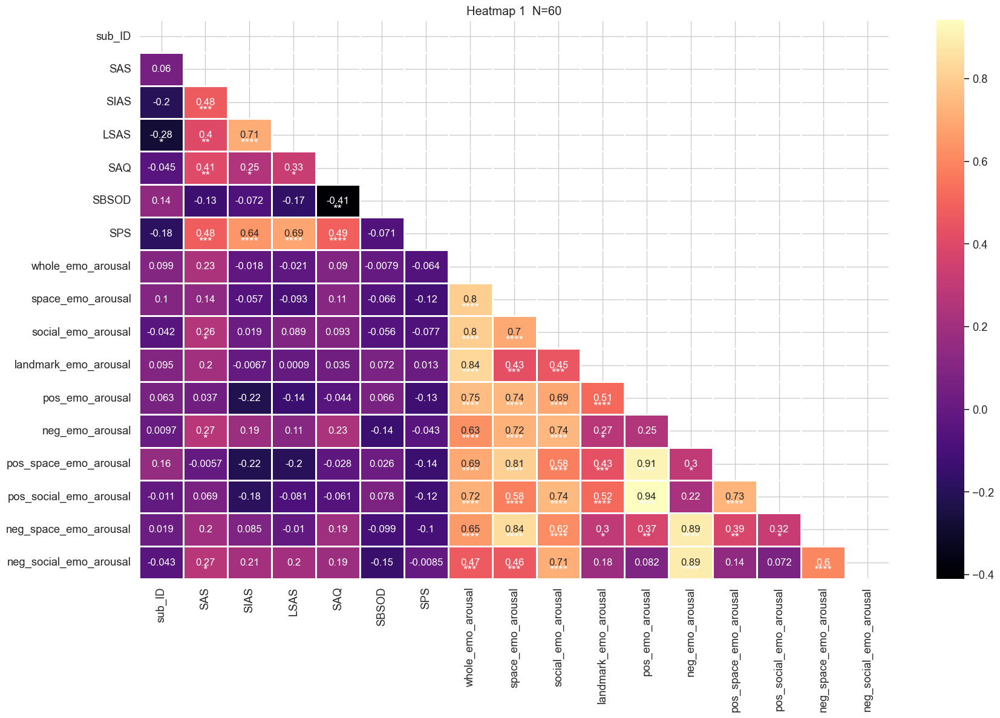

In [188]:
c = generate_corrmap(behdata, behdata,quizlist ,nav_emo_a, location='plot_behave/ques_nav_emo_arousal')

## 2. Correlation between matrics and rest state result

1. rest state asymmetry data and questionnaire data

In [18]:
# variety  behdata.loc[:,[]]

asydatalist = asydata_cropped.columns.to_list()
asydatalist

['LFC_AA_index_log', 'LTPJ_AA_index_log', 'sub_ID']

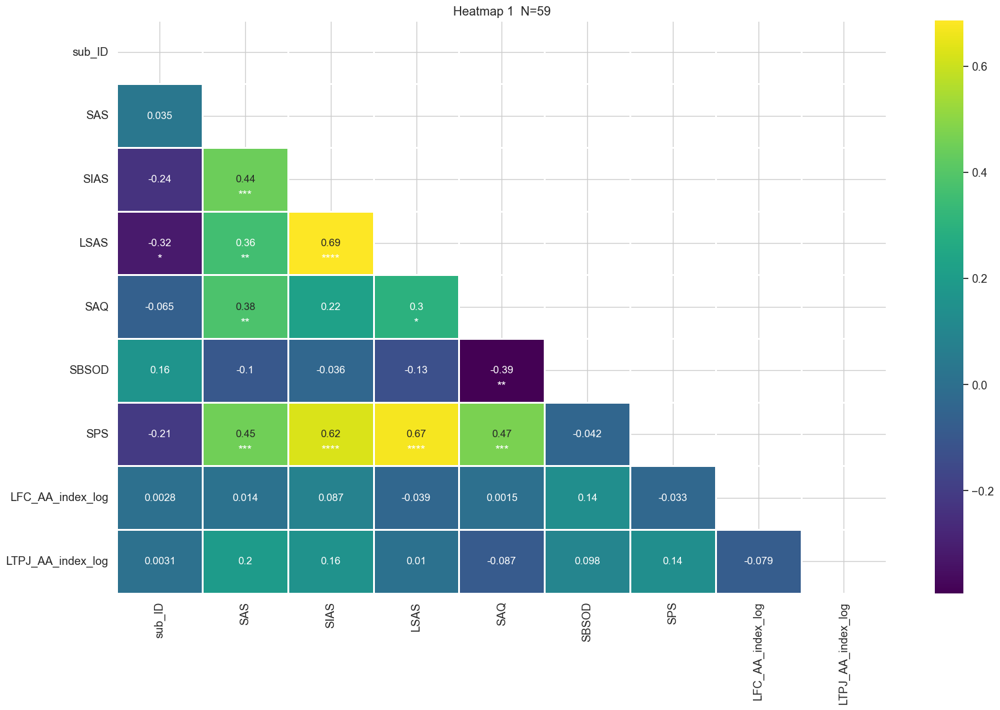

In [19]:
c = generate_corrmap(behdata, asydata_cropped,quizlist,asydatalist, location='plot_rest/rest_asy_ques')

2. rest state asymmetry data and practice metrics

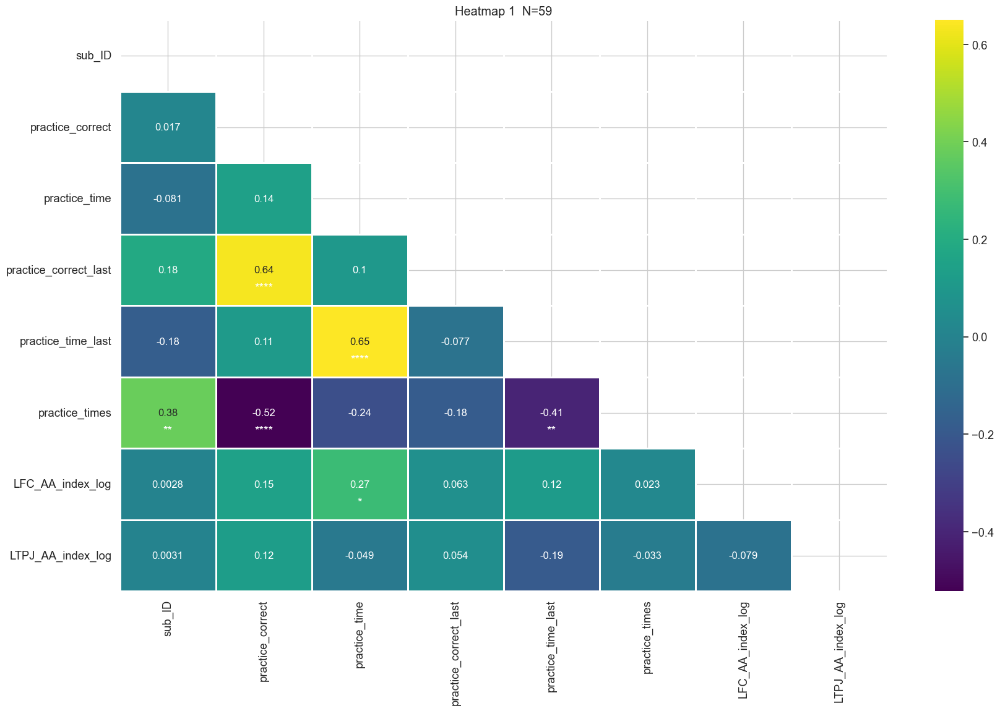

In [63]:
c = generate_corrmap(behdata, asydata_cropped, nav_prac,asydatalist, location='plot_rest/rest_asy_prac')

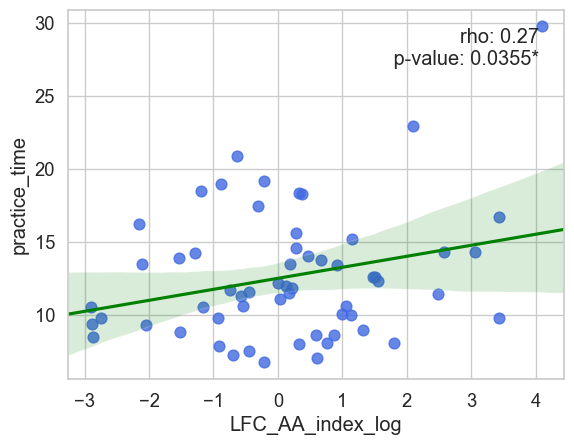

<Figure size 640x480 with 0 Axes>

In [66]:
plot_reg('LFC_AA_index_log','practice_time',c,row=0,col=0,ind=0,save =False)

3. rest state asymmetry data and nav (speed / distance / pausetime)

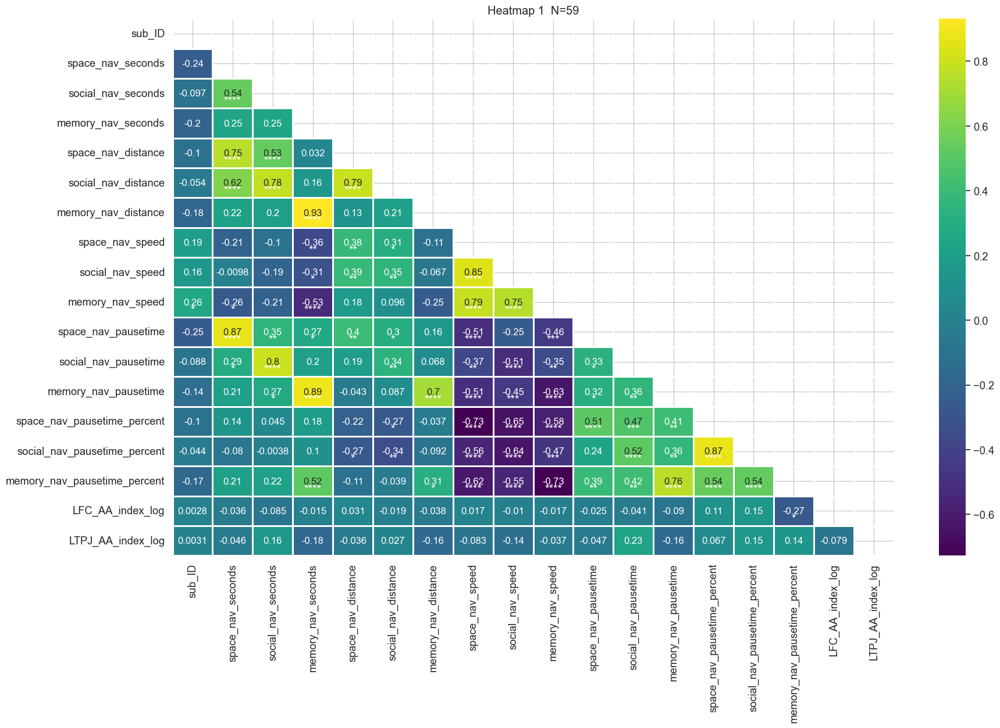

In [58]:
c = generate_corrmap(behdata, asydata_cropped,nav_no_block ,asydatalist, location='plot_rest/rest_asy_nav')

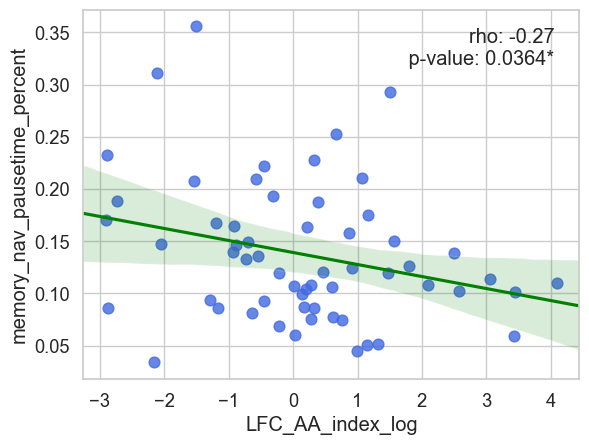

<Figure size 640x480 with 0 Axes>

In [62]:
plot_reg('LFC_AA_index_log','memory_nav_pausetime_percent',c,row=0,col=0,ind=0,save =False)

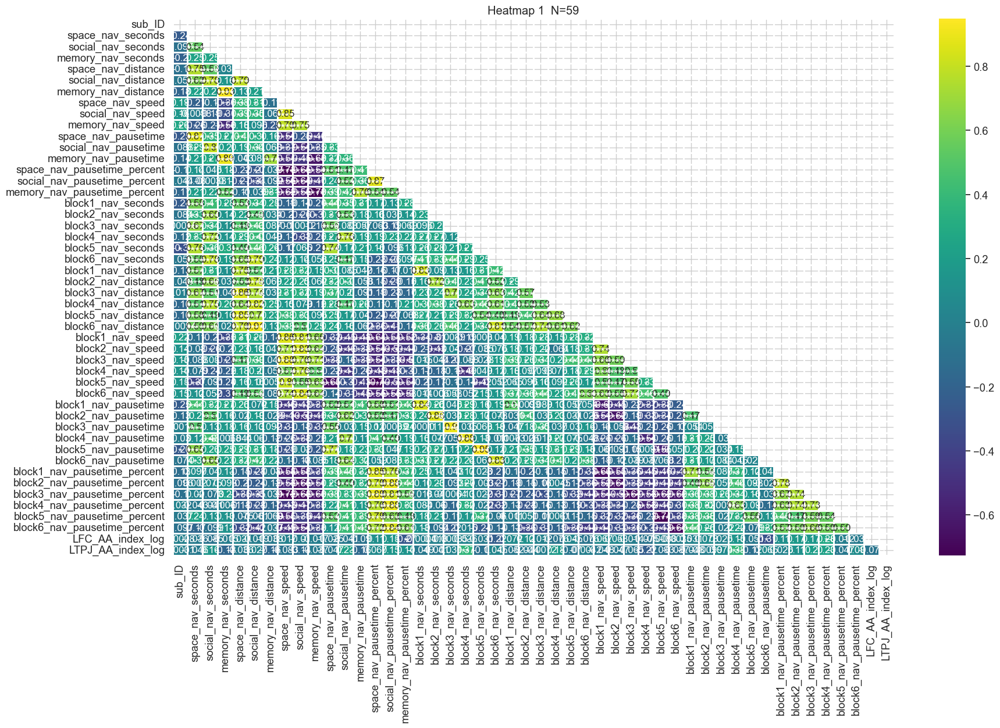

In [59]:
c = generate_corrmap(behdata, asydata_cropped,nav ,asydatalist)

3.2. rest state asymmetry data and nav (Approach/ Leave)

In [1]:
c = generate_corrmap(behdata, asydata_cropped, nav_app_speed,asydatalist, location='plot_rest/rest_asy_approach')

NameError: name 'generate_corrmap' is not defined

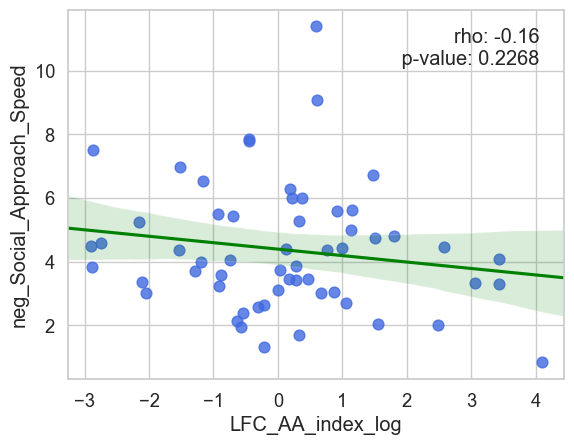

<Figure size 640x480 with 0 Axes>

In [57]:
plot_reg('LFC_AA_index_log','neg_Social_Approach_Speed',c,row=0,col=0,ind=0,save =False)

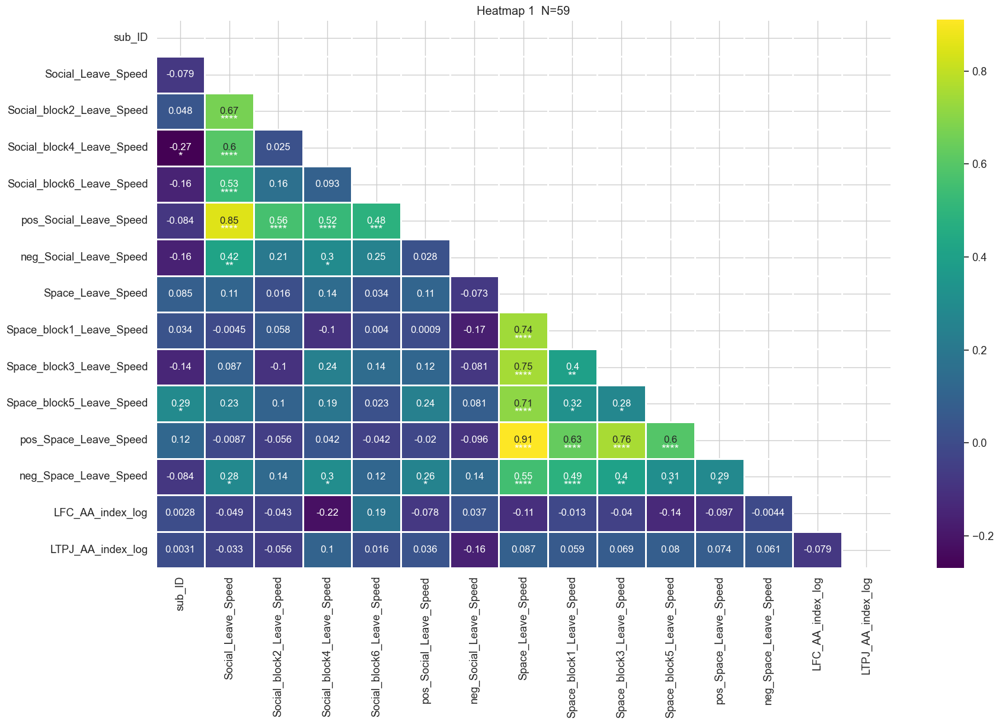

In [23]:
c = generate_corrmap(behdata, asydata_cropped, nav_leave_speed,asydatalist, location='plot_rest/rest_asy_leave')

3.3. rest state asymmetry data and nav (entropy)

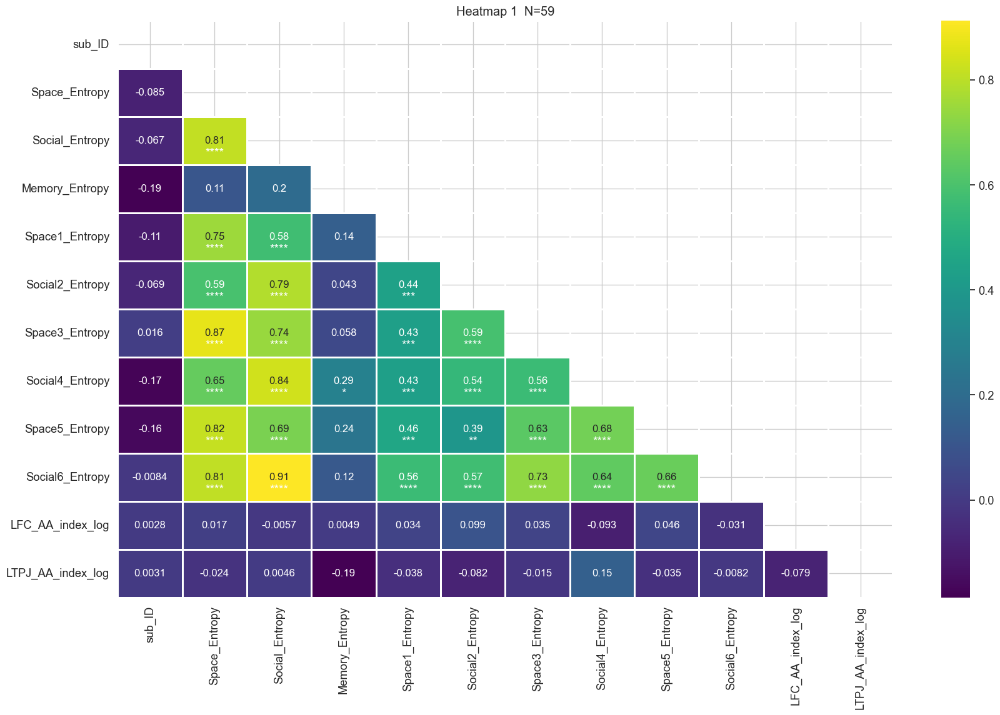

In [24]:
c = generate_corrmap(behdata, asydata_cropped, nav_entropy,asydatalist, location='plot_rest/rest_asy_entropy')

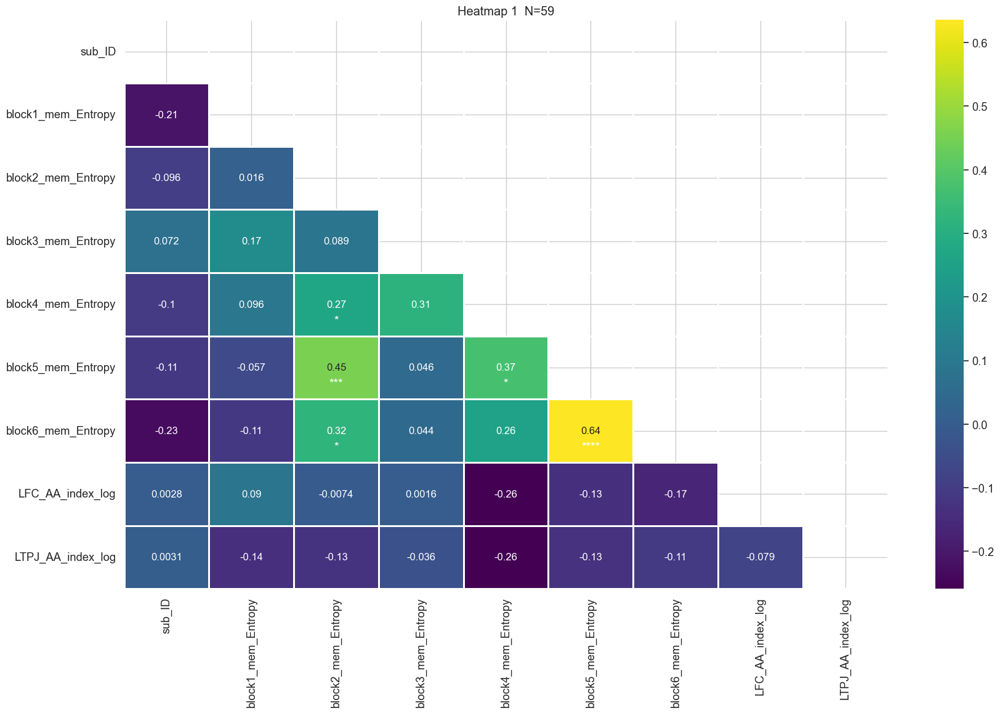

In [25]:
c = generate_corrmap(behdata, asydata_cropped, nav_entropy_mem_change,asydatalist, location='plot_rest/rest_asy_entropy_mem')

4. rest state asymmetry data and nav (reward)

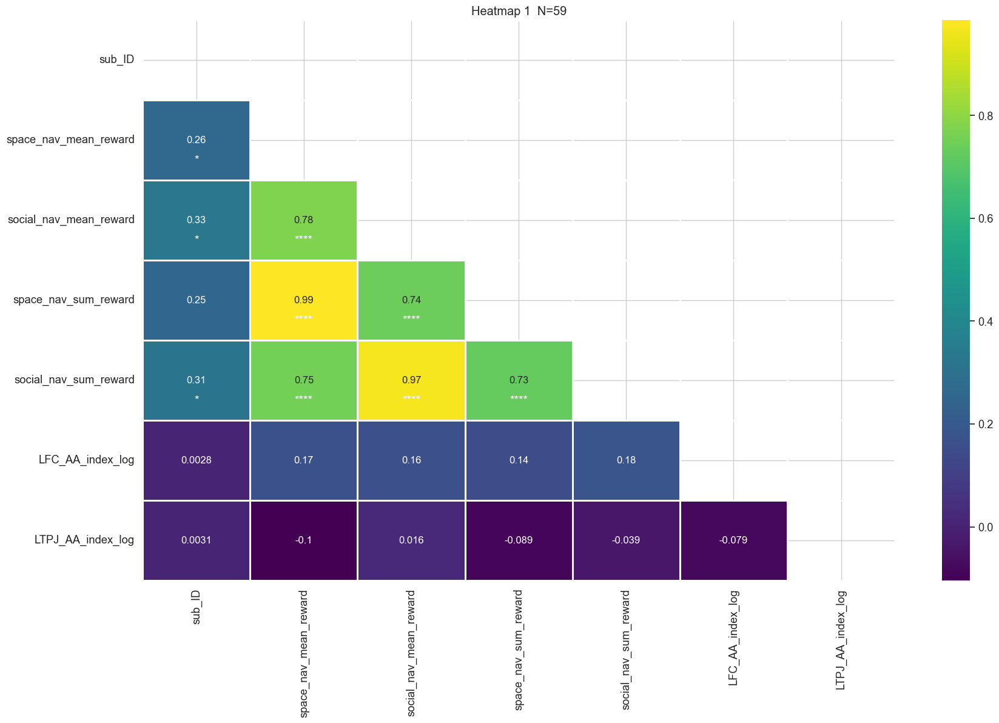

In [26]:
c = generate_corrmap(behdata, asydata_cropped, nav_reward,asydatalist, location='plot_rest/rest_asy_reward')

5. rest state asymmetry data  and nav_rate (willingness/anxiety)

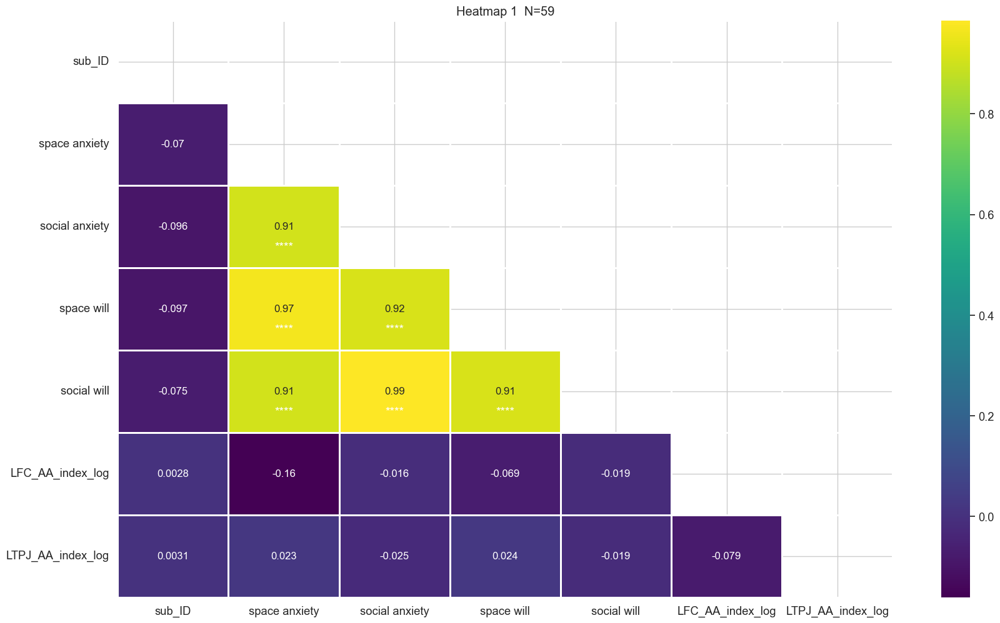

In [27]:
c = generate_corrmap(behdata, asydata_cropped, nav_rate,asydatalist, location='plot_rest/rest_asy_rate')

6. rest state asymmetry data and nav_mem ( corr/rts for recognition task)

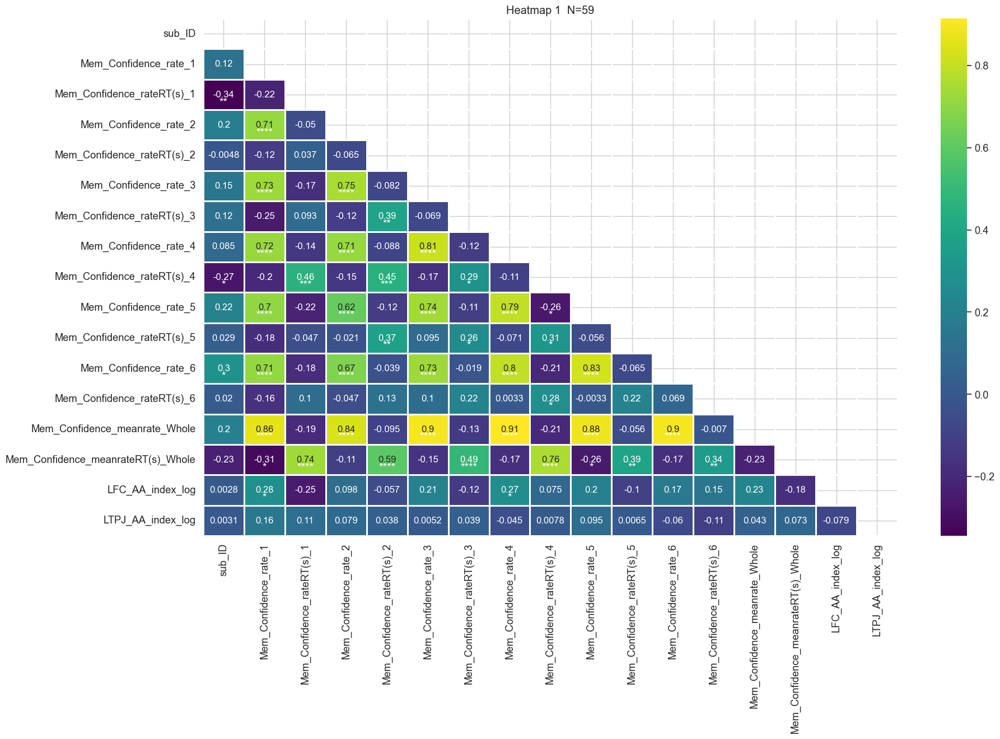

In [28]:
c = generate_corrmap(behdata, asydata_cropped, nav_conf ,asydatalist, location='plot_rest/rest_asy_confidence')

7. rest state asymmetry data and nav_mem ( corr/rts for recognition task)

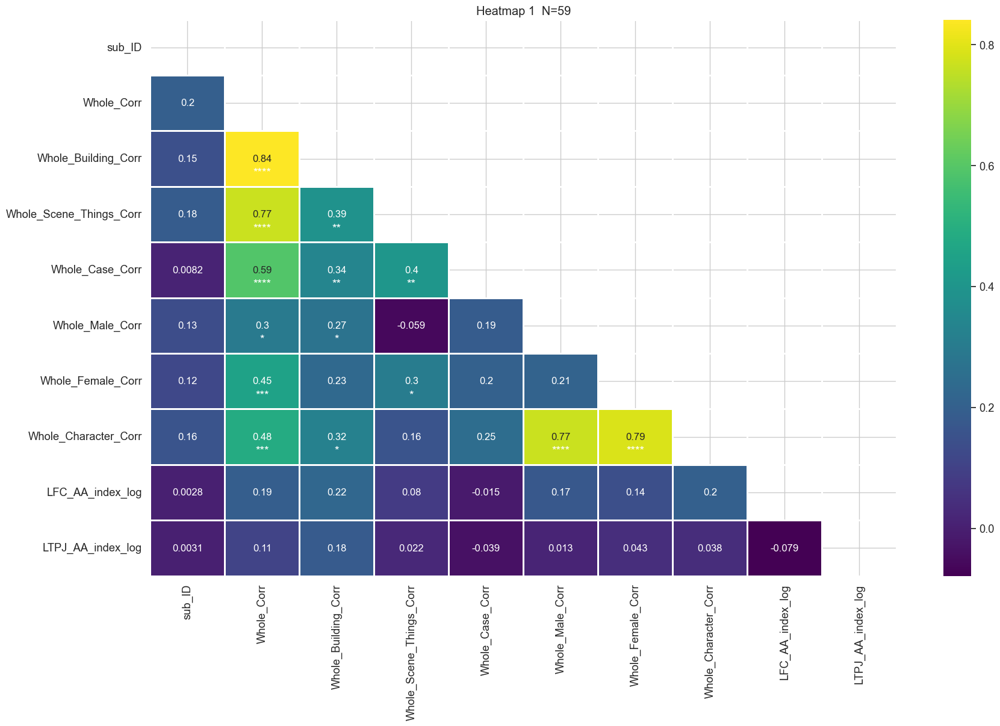

In [29]:
c = generate_corrmap(behdata, asydata_cropped, nav_mem_whole_corr ,asydatalist, location='plot_rest/rest_asy_mem')
# nav_mem_whole_RT

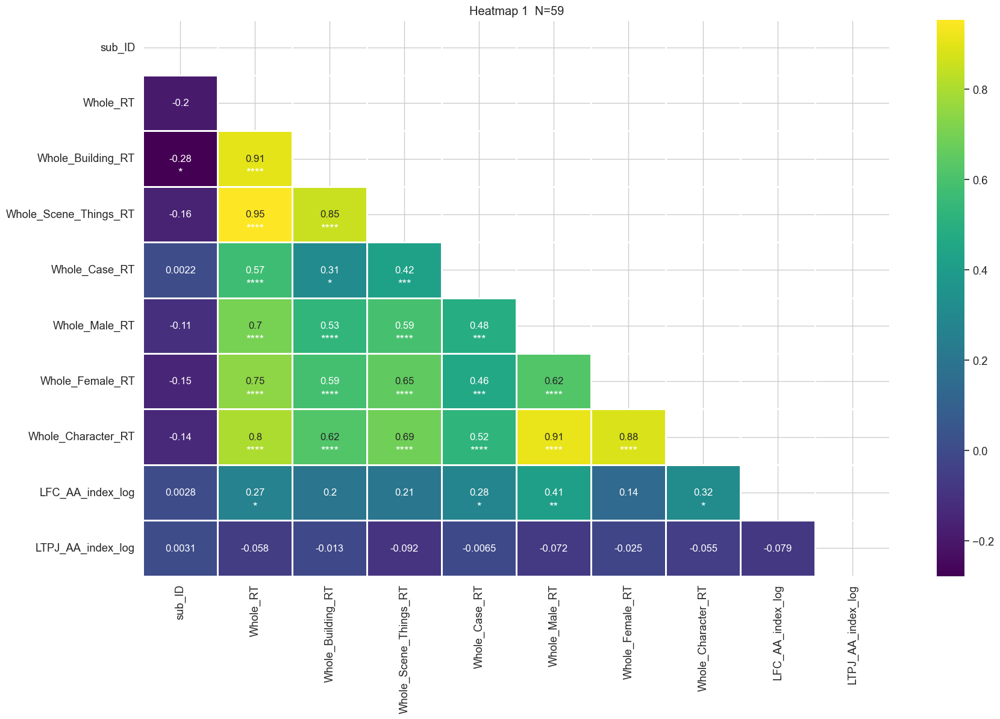

In [30]:
c = generate_corrmap(behdata, asydata_cropped, nav_mem_whole_RT ,asydatalist, location='plot_rest/rest_asy_mem_RT')


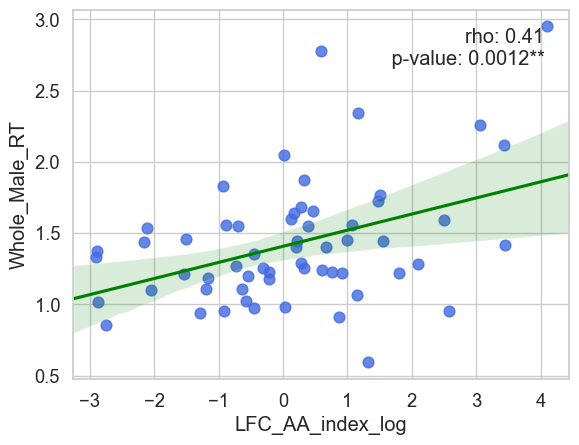

<Figure size 640x480 with 0 Axes>

In [31]:
plot_reg('LFC_AA_index_log','Whole_Male_RT',c,row=0,col=0,ind=0,save =False)

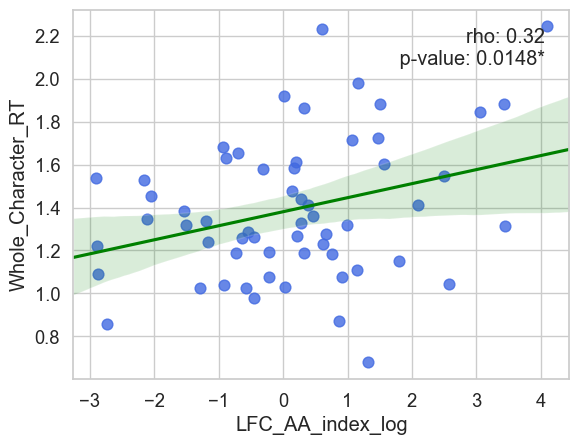

<Figure size 640x480 with 0 Axes>

In [34]:
plot_reg('LFC_AA_index_log','Whole_Character_RT',c,row=0,col=0,ind=0,save =False)

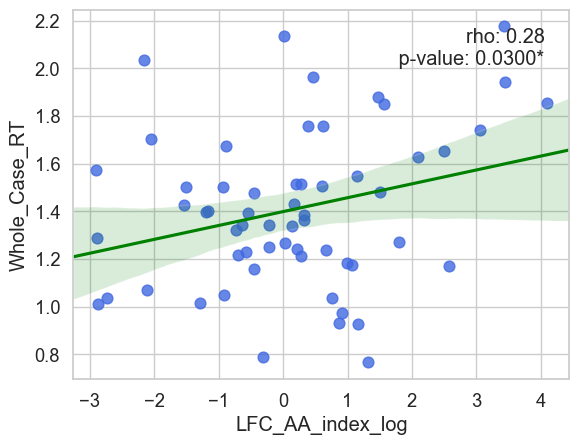

<Figure size 640x480 with 0 Axes>

In [37]:
plot_reg('LFC_AA_index_log','Whole_Case_RT',c,row=0,col=0,ind=0,save =False)

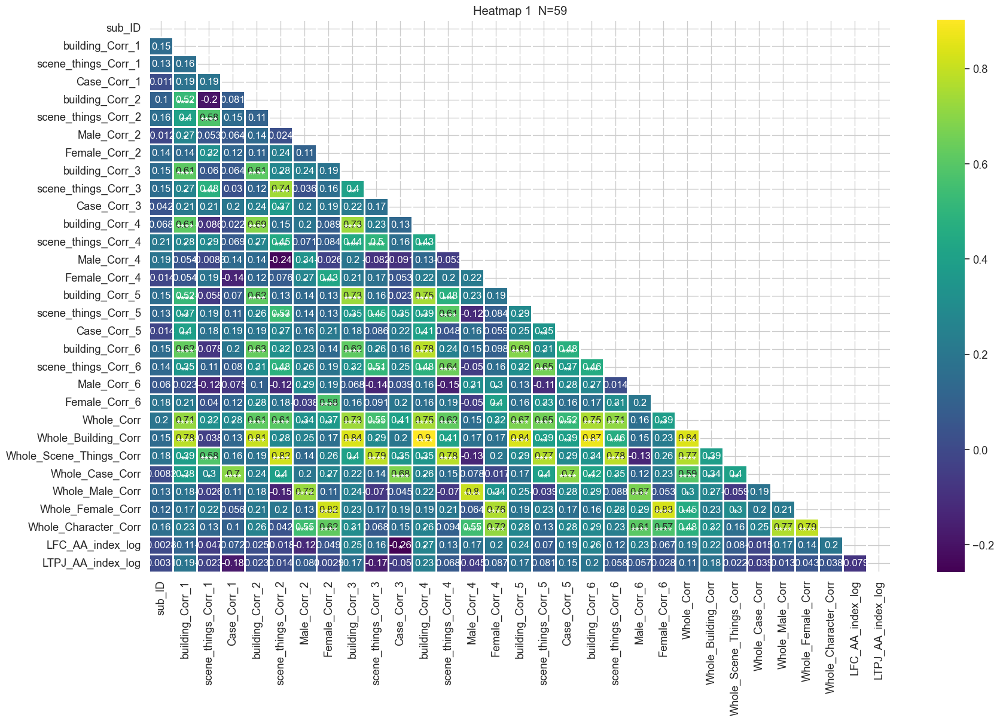

In [38]:
nav_mem_corr = ['sub_ID'] + [i for i in nav_mem if 'Corr' in i and 'CorrT' not in i and 'CorrF' not in i]

c = generate_corrmap(behdata, asydata_cropped, nav_mem_corr ,asydatalist, location='plot_rest/rest_asy_mem_corr')


8. rest state asymmetry data and nav_arrangement_day1 (distance error)

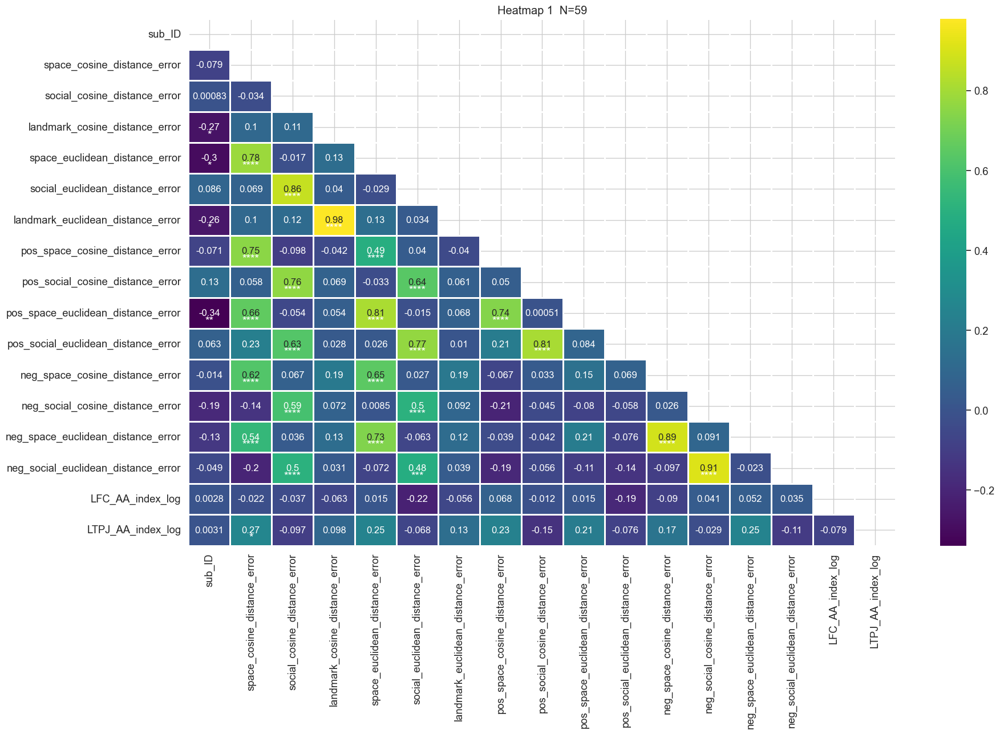

In [39]:
c = generate_corrmap(behdata, asydata_cropped, nav_arrd1 ,asydatalist, location='plot_rest/rest_asy_arranged1')

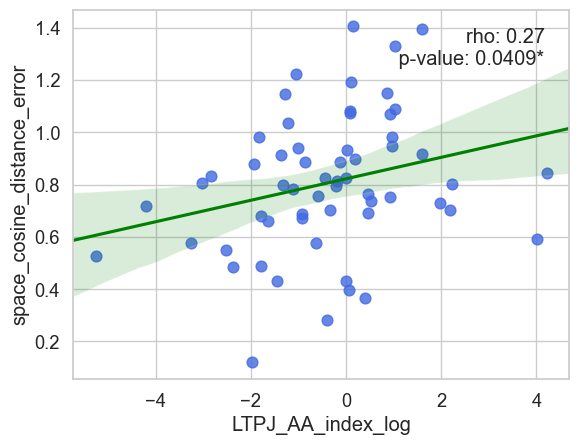

<Figure size 640x480 with 0 Axes>

In [43]:
plot_reg('LTPJ_AA_index_log','space_cosine_distance_error',c,row=0,col=0,ind=0,save =False)

9. rest state asymmetry data and nav_arrangement_day2 (distance error)

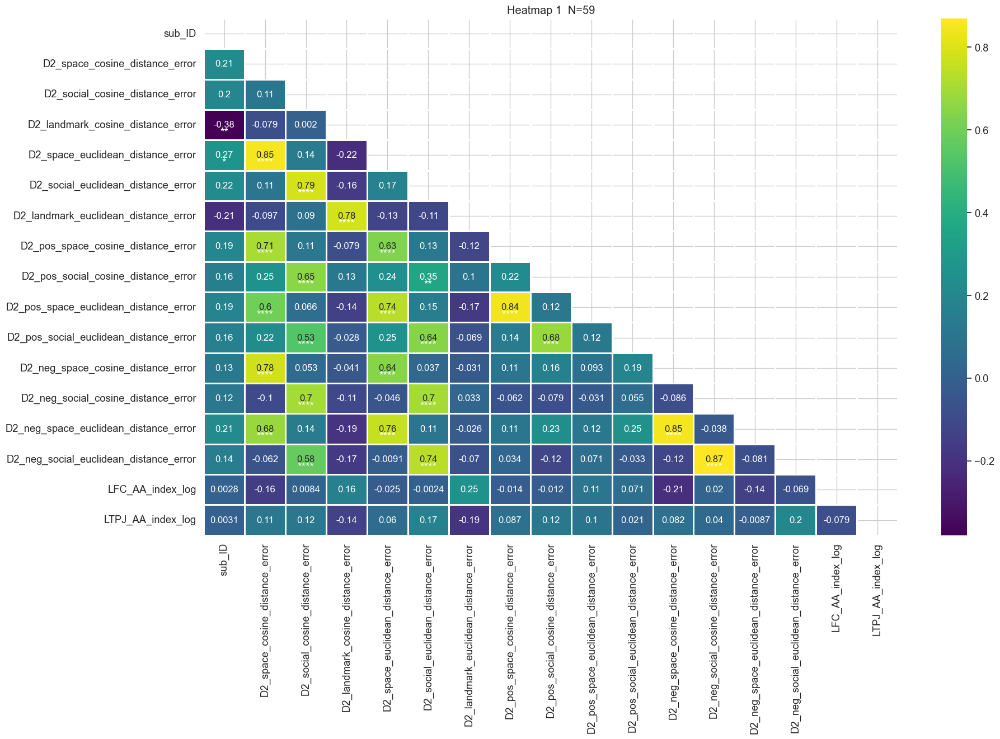

In [44]:
c = generate_corrmap(behdata, asydata_cropped, nav_arrd2 ,asydatalist, location='plot_rest/rest_asy_arranged2')

10. rest state asymmetry data and nav_pref_day2 (rt/rate)

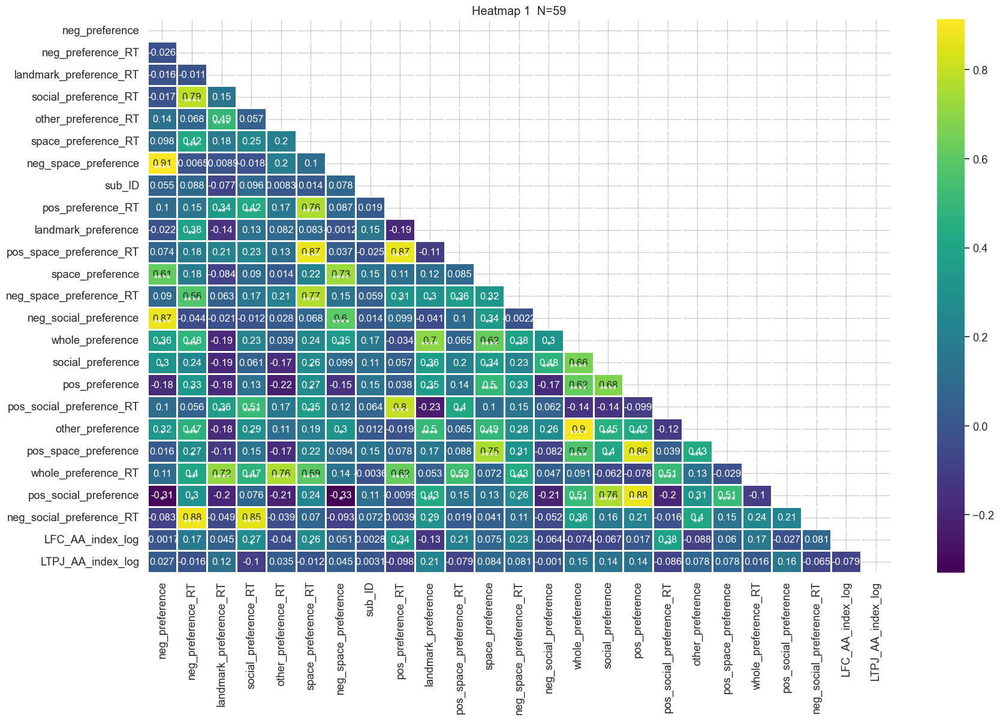

In [47]:
c = generate_corrmap(behdata, asydata_cropped, nav_pref ,asydatalist, location='plot_rest/rest_asy_pref')

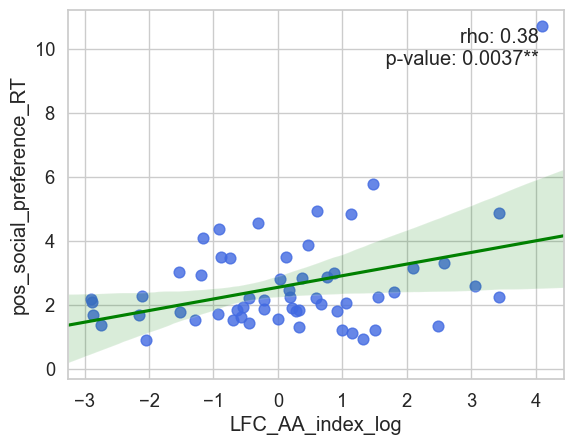

<Figure size 640x480 with 0 Axes>

In [50]:
plot_reg('LFC_AA_index_log','pos_social_preference_RT',c,row=0,col=0,ind=0,save =False)

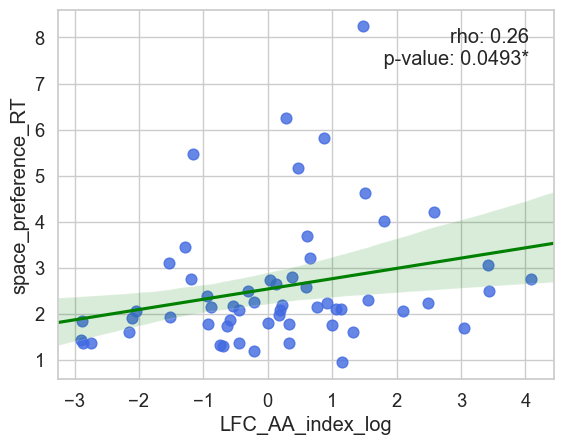

<Figure size 640x480 with 0 Axes>

In [53]:
plot_reg('LFC_AA_index_log','space_preference_RT',c,row=0,col=0,ind=0,save =False)

11.  rest state asymmetry data and nav_emotion (valence/arousal)

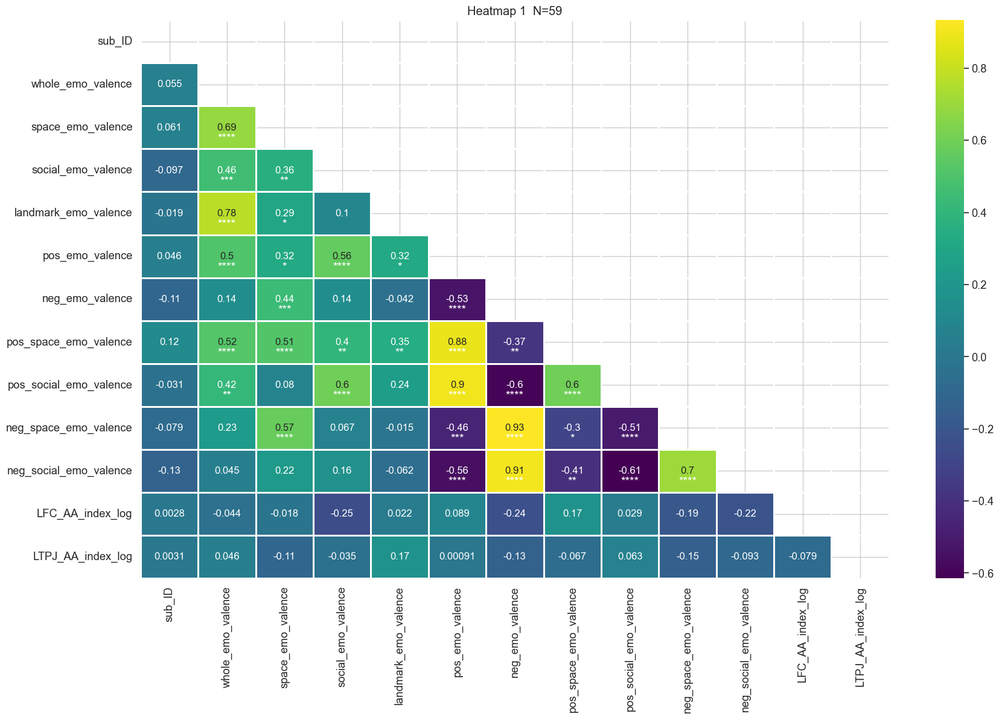

In [45]:
c = generate_corrmap(behdata, asydata_cropped, nav_emo_v ,asydatalist, location='plot_rest/rest_asy_emo_v')

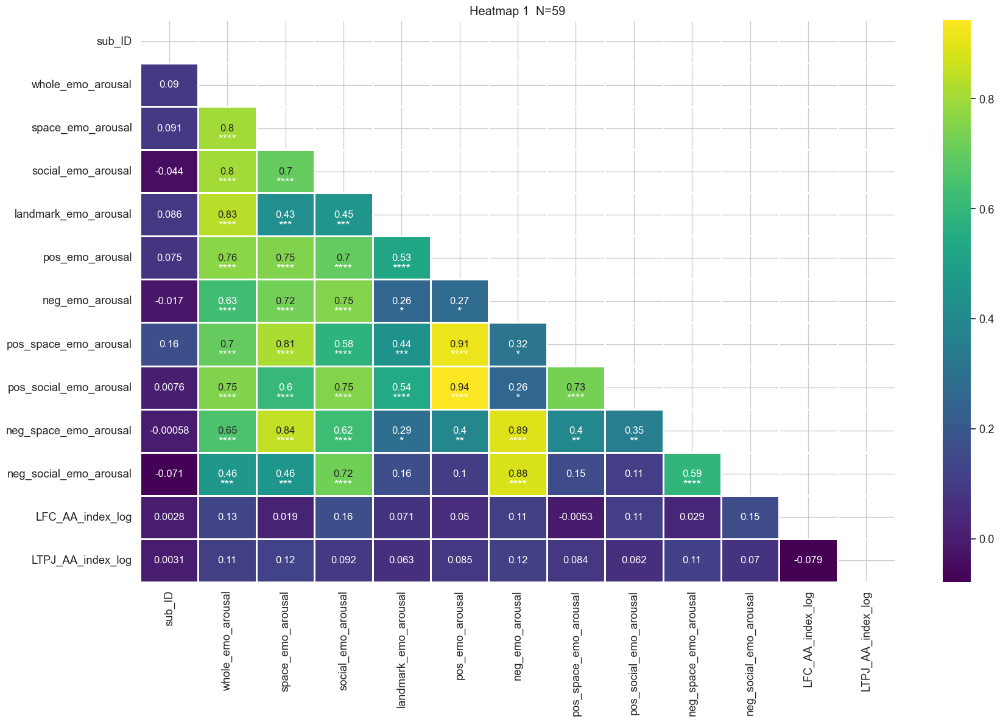

In [46]:
c = generate_corrmap(behdata, asydata_cropped, nav_emo_a ,asydatalist, location='plot_rest/rest_asy_emo_a')